## Table of Contents
- [Time Series Components](#tsc)
- [Moving Average Smoothing](#mas)
- [White Noise](#wn)
- [Time Series Decomposition](#tsd)
- [Smoothing Time Series with Exponential Smoothing](#exp)
- [Use and Remove Trends](#dt)
- [Use and Remove Seasonality](#ds)
- [Stationarity in Time Series](#stationarity)
- [Model Evaluation](#eval)
- [Naive Forecasting (Baseline Model)](#naive)
- [Residual Forecast Errors](#res)
- [ARIMA Models](#arima)
- [Autocorrelation and Partial Autocorrelation](#corr)
- [ARCH and GARCH Models](#arch)
- [Facebook Prophet](#fb)
- [Time Series as Supervised Learning](#ml)



In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sb
sb.set_style("dark")

[Refer to Time Series Analysis statsmodels Package in Python](https://www.statsmodels.org/dev/user-guide.html#time-series-analysis)

it can be better to use a pandas series with date as indices as this eliminates sometimes errors and also can be better in visuals as you will see below.
`#parse dates=True: We give the function a hint that data in the first column contains dates that need to be parsed.
#index col=0: We hint that the first column contains the index information for the time series.
#squeeze=True: We hint that we only have one data column and that we are interested in a Series and not a DataFrame.
airline_series = pd.read_csv('Datasets/airline-passengers.csv', header=0, index_col=0, parse_dates=True,
squeeze=True)`

In [2]:
# Load Datasets

daily_fem_births = pd.read_csv('Datasets\daily-total-female-births.csv')
daily_fem_births['Date']= pd.to_datetime(daily_fem_births['Date'])

daily_min_temp = pd.read_csv('Datasets\daily-minimum-temperatures.csv')
daily_min_temp['Date']= pd.to_datetime(daily_min_temp['Date'])

shampoo_sales = pd.read_csv('Datasets\shampoo-sales.csv')
shampoo_sales['Month'] = '190' + shampoo_sales.Month # add prefix of 190 to include year
shampoo_sales['Date']= pd.to_datetime(shampoo_sales['Month'])

airline_df = pd.read_csv('Datasets/airline-passengers.csv')
airline_df['Date']= pd.to_datetime(airline_df['Month'])

sunspots_df = pd.read_csv('Datasets\sunspots.csv')
sunspots_df['Month']= pd.to_datetime(sunspots_df['Month'])

In [36]:
print('dataframe: ', daily_fem_births.head())
print('shape: ', daily_fem_births.shape)
print('query by time when index is date', daily_fem_births.query("Date=='1959-01-01'"))
print('descriptive stats', daily_fem_births.describe())

dataframe:           Date  Births
0  1959-01-01      35
1  1959-01-02      32
2  1959-01-03      30
3  1959-01-04      31
4  1959-01-05      44
shape:  (365, 2)
query by time when index is date          Date  Births
0  1959-01-01      35
descriptive stats            Births
count  365.000000
mean    41.980822
std      7.348257
min     23.000000
25%     37.000000
50%     42.000000
75%     46.000000
max     73.000000


In [39]:
print('dataframe: ', daily_min_temp.head())
print('shape: ', daily_min_temp.shape)
print('descriptive stats', daily_min_temp.describe())

dataframe:           Date  Temp
0  1981-01-01  20.7
1  1981-01-02  17.9
2  1981-01-03  18.8
3  1981-01-04  14.6
4  1981-01-05  15.8
shape:  (3650, 2)
descriptive stats               Temp
count  3650.000000
mean     11.177753
std       4.071837
min       0.000000
25%       8.300000
50%      11.000000
75%      14.000000
max      26.300000


In [115]:
print('dataframe: ', shampoo_sales.head())
print('shape: ', shampoo_sales.shape)
print('descriptive stats', shampoo_sales.describe())

dataframe:    Month  Sales
0  1-01  266.0
1  1-02  145.9
2  1-03  183.1
3  1-04  119.3
4  1-05  180.3
shape:  (36, 2)
descriptive stats             Sales
count   36.000000
mean   312.600000
std    148.937164
min    119.300000
25%    192.450000
50%    280.150000
75%    411.100000
max    682.000000


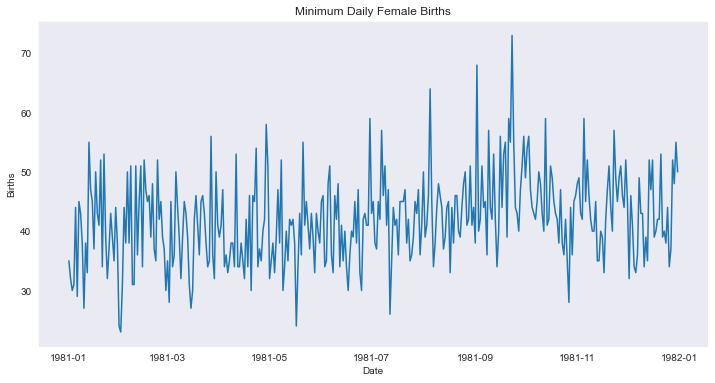

In [205]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births.Date, daily_fem_births.Births);
plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');

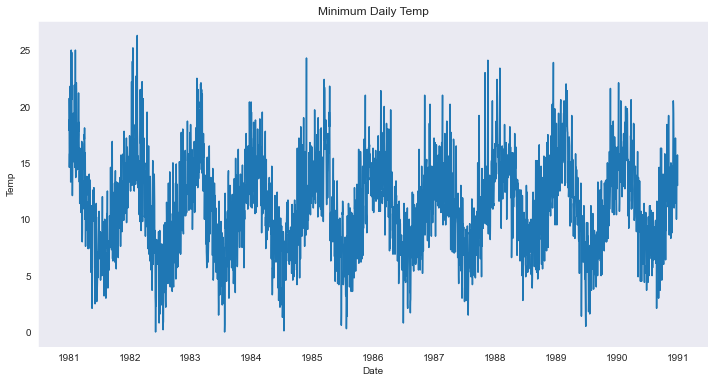

In [207]:
plt.figure(figsize=(12,6));
plt.plot(daily_min_temp.Date, daily_min_temp.Temp);
plt.xlabel('Date');
plt.ylabel('Temp');
plt.title('Minimum Daily Temp');

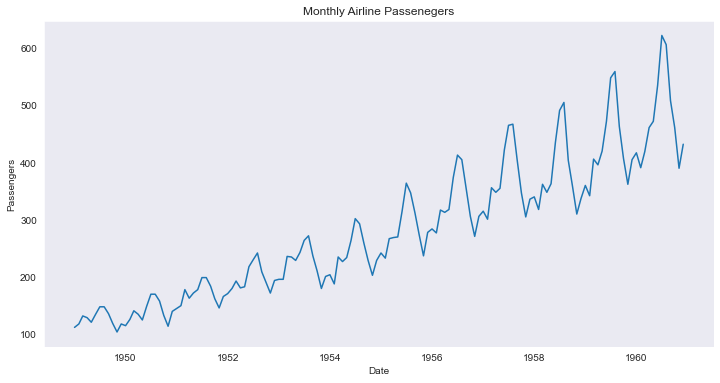

In [261]:
plt.figure(figsize=(12,6));
plt.plot(airline_df.Date, airline_df.Passengers);
plt.xlabel('Date');
plt.ylabel('Passengers');
plt.title('Monthly Airline Passenegers');

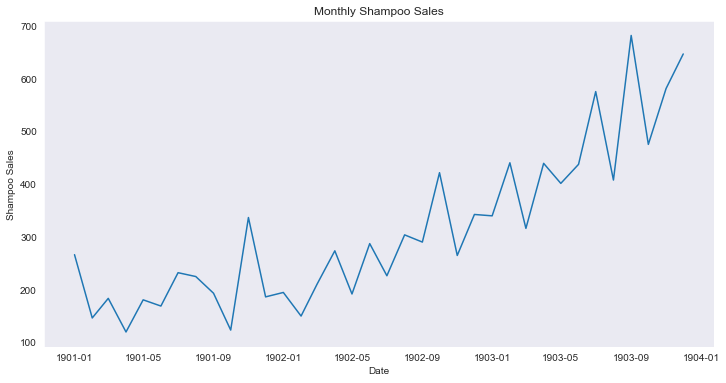

In [22]:
plt.figure(figsize=(12,6));
plt.plot(shampoo_sales.Date, shampoo_sales.Sales);
plt.xlabel('Date');
plt.ylabel('Shampoo Sales');
plt.title('Monthly Shampoo Sales');

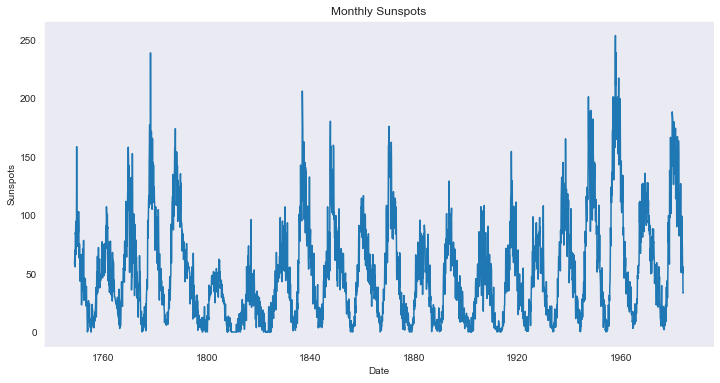

In [179]:
plt.figure(figsize=(12,6));
plt.plot(sunspots_df.Month, sunspots_df.Sunspots);
plt.xlabel('Date');
plt.ylabel('Sunspots');
plt.title('Monthly Sunspots');

In [467]:
def run_sequence_plot(x, y, title, xlabel="time", ylabel="series"):
    plt.figure(figsize=(12,6))
    plt.plot(x, y, 'k-', label="actual")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend();

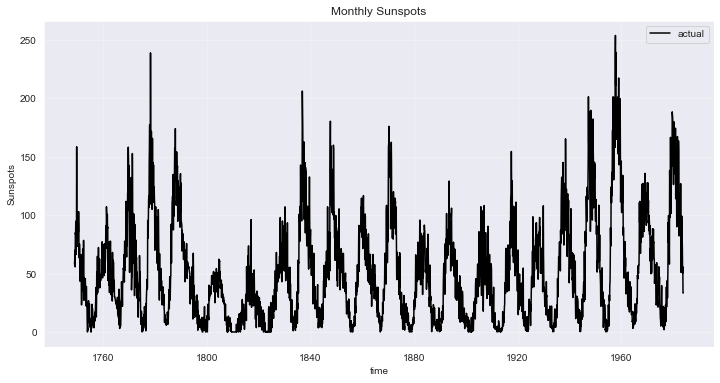

In [468]:
run_sequence_plot(sunspots_df.Month, sunspots_df.Sunspots, title="Monthly Sunspots", xlabel="time", ylabel="Sunspots")

<a id='tsc'></a>
# Time Series Components 

In [318]:
# reproducibility
np.random.seed(42)

# time component
time = np.arange(100)

# data
noise = np.random.normal(loc=0, scale=6.5, size=len(time))
trend = time * 2.75
seasonality = 10 + np.sin(time * 0.25) * 20
data = trend + seasonality + noise

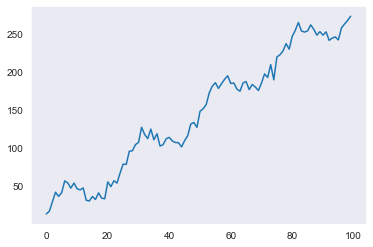

In [320]:
plt.plot(data);

<a id='mas'></a>
# Moving Average Smoothing

In [123]:
daily_fem_births.columns

Index(['Date', 'Births'], dtype='object')

In [153]:
window_width = 3
daily_fem_births['rolled_mean'] = daily_fem_births.Births.rolling(window_width).mean()
daily_fem_births

,Date,Births,rolled_mean
0,1981-01-01,35,NaN
1,1981-01-02,32,NaN
2,1981-01-03,30,32.333333
3,1981-01-04,31,31.000000
4,1981-01-05,44,35.000000
...,...,...,...
360,1981-12-27,37,38.333333
361,1981-12-28,52,41.000000
362,1981-12-29,48,45.666667
363,1981-12-30,55,51.666667


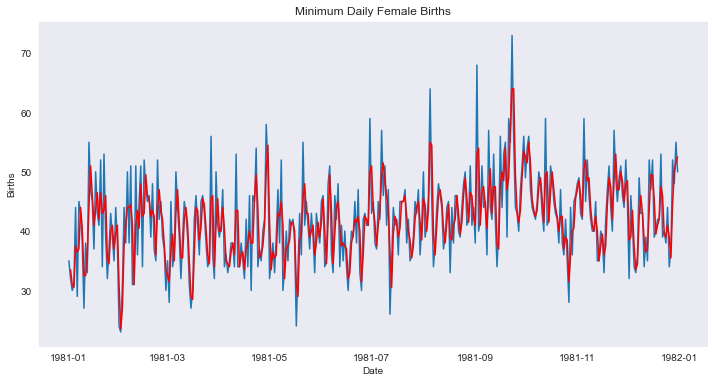

In [142]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births.Date, daily_fem_births.Births);
plt.plot(daily_fem_births.Date, daily_fem_births.rolled_mean, 'red');
plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');

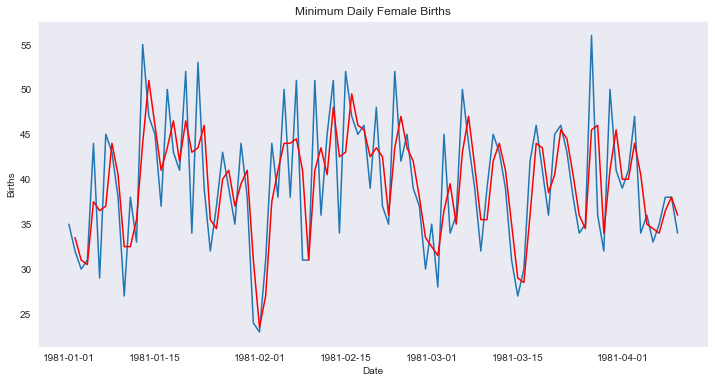

In [143]:
# zooming in

plt.figure(figsize=(12,6));
plt.plot(daily_fem_births.Date[:100], daily_fem_births.Births[:100]);
plt.plot(daily_fem_births.Date[:100], daily_fem_births.rolled_mean[:100], 'red');
plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');

#### Moving average as prediciton

The moving average value can also be used directly to make predictions. It is a naive model
and assumes that the trend and seasonality components of the time series have already been
removed or adjusted for. The moving average model for predictions can easily be used in a
walk-forward manner. As new observations are made available (e.g. daily), the model can be
updated and a prediction made for the next day

In [182]:
window_width = 5
daily_fem_births['rolled_mean_pred'] = daily_fem_births.Births.rolling(window_width).mean().shift(1)
daily_fem_births

,Date,Births,rolled_mean,rolled_mean_pred
0,1981-01-01,35,NaN,NaN
1,1981-01-02,32,NaN,NaN
2,1981-01-03,30,32.333333,NaN
3,1981-01-04,31,31.000000,NaN
4,1981-01-05,44,35.000000,NaN
...,...,...,...,...
360,1981-12-27,37,38.333333,39.0
361,1981-12-28,52,41.000000,38.6
362,1981-12-29,48,45.666667,41.0
363,1981-12-30,55,51.666667,43.0


In [190]:
from sklearn.metrics import mean_squared_error
for window_width in range (2,20, 5):
    daily_fem_births['rolled_mean_pred'] = daily_fem_births.Births.rolling(window_width).mean().shift(1)
    print("RMSE for moving average smoothing with window size of {} = {}".format(
        window_width,
        np.sqrt(mean_squared_error(daily_fem_births.Births[window_width:], daily_fem_births.rolled_mean_pred[window_width:]))))

RMSE for moving average smoothing with window size of 2 = 8.152303668069457
RMSE for moving average smoothing with window size of 7 = 7.281757998172671
RMSE for moving average smoothing with window size of 12 = 7.324015992695044
RMSE for moving average smoothing with window size of 17 = 7.202525055821184


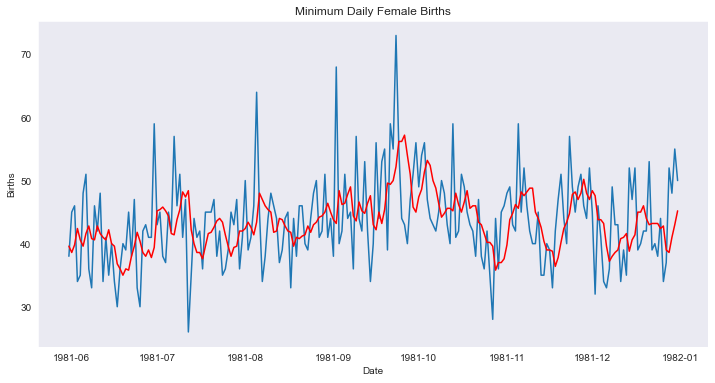

In [178]:
# zooming in
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births.Date[150:], daily_fem_births.Births[150:]);
plt.plot(daily_fem_births.Date[150:], daily_fem_births.rolled_mean_pred[150:], 'red');
plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');

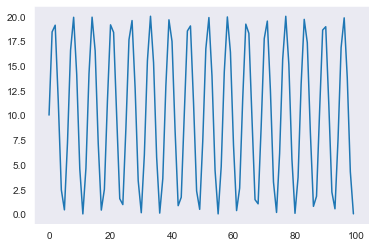

In [201]:
# Task: check MA with seasonal data
seasonality = 10 + np.sin(np.arange(0,100)) * 10
plt.plot(seasonality);

<a id='wn'></a>
# White Noise

In [192]:
normal_data = np.random.normal(loc=0,scale=1, size=1000)

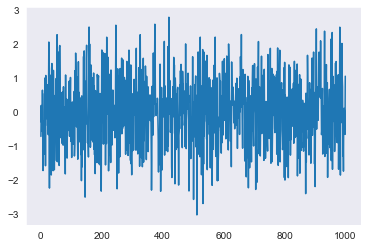

In [194]:
plt.plot(normal_data);

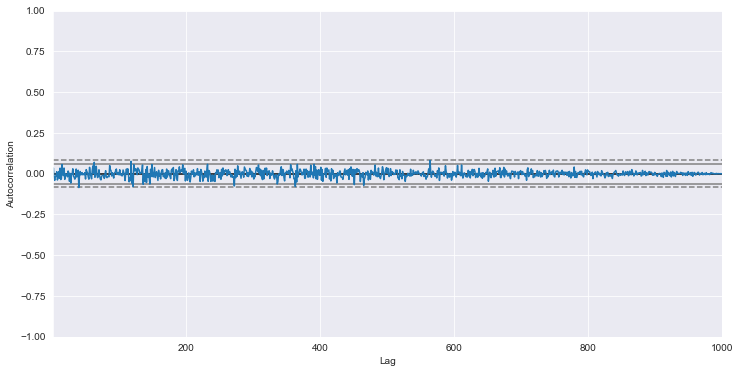

In [197]:
from pandas.plotting import autocorrelation_plot
plt.figure(figsize=(12,6));
autocorrelation_plot(normal_data);

<a id='tsd'></a>
# Time Series Decomposition

### Classical decomposition 

[Classical decomposition statsmodel](https://www.statsmodels.org/dev/generated/statsmodels.tsa.seasonal.seasonal_decompose.html)

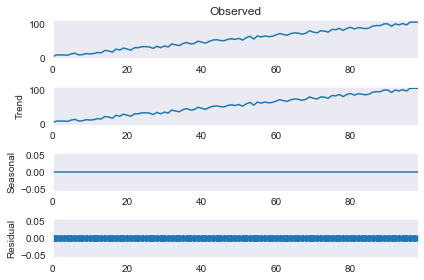

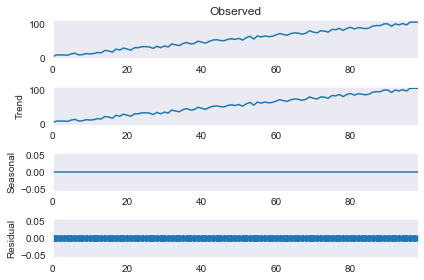

In [212]:
from statsmodels.tsa.seasonal import seasonal_decompose
import random
#generate a series with trend added to it random noise
series = [i+random.randrange(10) for i in range(1,100)]
# make an additive decomposition
result = seasonal_decompose(series, model='additive', period=1)
result.plot()

We can also see that the residual plot shows zero. This is a good example where the naive, or
classical, decomposition was not able to separate the noise that we added from the linear trend.
The naive decomposition method is a simple one, and there are more advanced decompositions
available, like Seasonal and Trend decomposition using Loess or STL decomposition. 

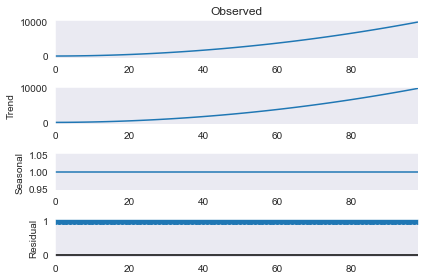

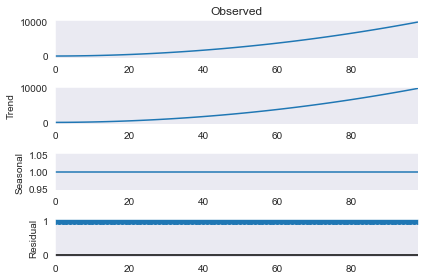

In [214]:
from statsmodels.tsa.seasonal import seasonal_decompose
import random
#generate a series with trend without random noise
series = [i**2 for i in range(1,100)]
# make a multiplicative decomposition
result = seasonal_decompose(series, model='multiplicative', period=1)
result.plot()

 we can see that, as in the additive case, the trend is easily extracted

In [263]:
result = seasonal_decompose(airline_df.Passengers, model='multiplicative')
result.plot()

ValueError: You must specify a period or x must be a pandas object with a DatetimeIndex with a freq not set to None

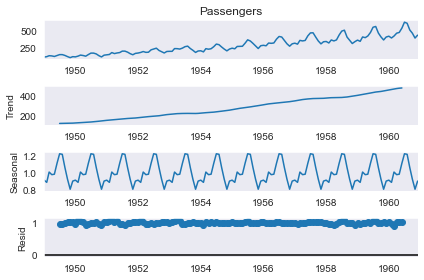

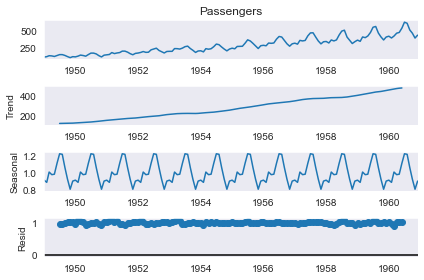

In [267]:
# to eliminate error we can define a period or do as follows, this is same in STL and MSTL

# parse dates=True: We give the function a hint that data in the first column contains dates that need to be parsed.
# index col=0: We hint that the first column contains the index information for the time series.
#squeeze=True: We hint that we only have one data column and that we are interested in a Series and not a DataFrame.
airline_series = pd.read_csv('Datasets/airline-passengers.csv', header=0, index_col=0, parse_dates=True,
squeeze=True)
result = seasonal_decompose(airline_series, model='multiplicative')
result.plot()


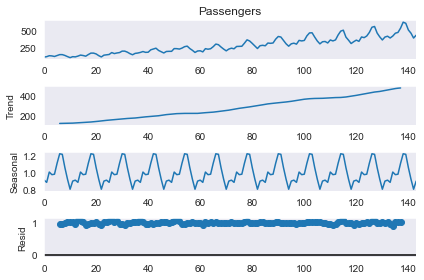

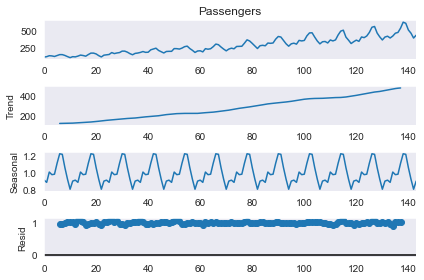

In [268]:
result = seasonal_decompose(airline_df.Passengers, model='multiplicative', period=12)
result.plot()

Running the example plots the observed, trend, seasonal, and residual time series. We can
see that the trend and seasonality information extracted from the series does seem reasonable.
The residuals are also interesting, showing periods of high variability in the early and later years
of the series.

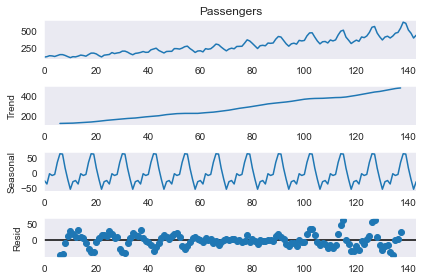

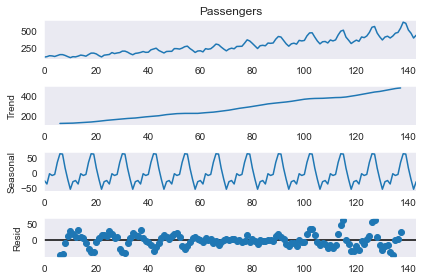

In [271]:
result = seasonal_decompose(airline_df.Passengers, model='additive', period=12)
result.plot()

### Seasonal-Trend decomposition using LOESS (STL)

[STL statsmodel](https://www.statsmodels.org/dev/examples/notebooks/generated/stl_decomposition.html)

[Forecasting after STL Decomposition](https://www.statsmodels.org/dev/tsa.html#forecasting-after-stl-decomposition)

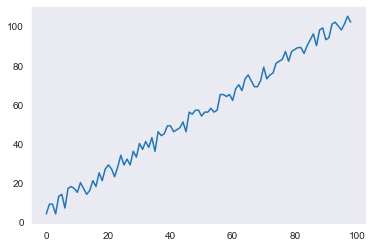

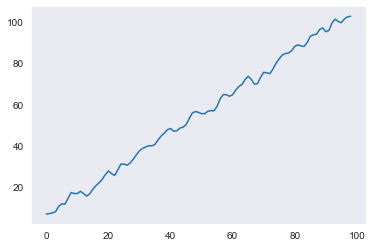

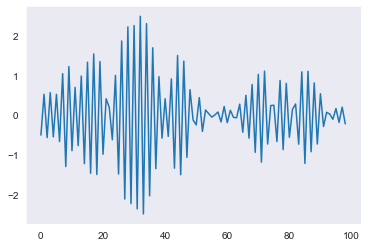

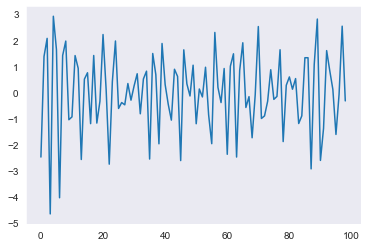

In [275]:
from statsmodels.tsa.seasonal import STL
import random
#generate a series with trend added to it random noise
series = [i+random.randrange(10) for i in range(1,100)]
# make an additive decomposition
stl = STL(series, period=2, seasonal=7, trend=None, low_pass=None,
    seasonal_deg=0, trend_deg=0, low_pass_deg=0, robust=False,
    seasonal_jump=1, trend_jump=1, low_pass_jump=1)

res = stl.fit()
#res_robust.plot()
plt.plot(res.observed)
plt.figure()
plt.plot(res.trend)
plt.figure()
plt.plot(res.seasonal)
plt.figure()
plt.plot(res.resid)

 set the period of the seasonality using the period. seasonal tells STL how many full seasons to use in the seasonal LOWESS but doesn't tell STL how many observations are needed for a full period.

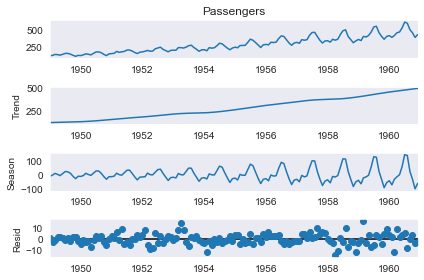

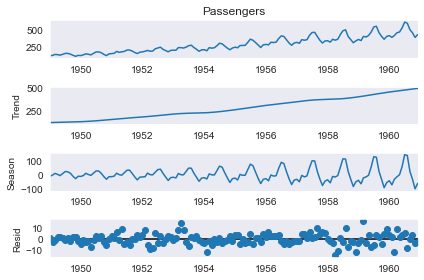

In [277]:
airline_series = pd.read_csv('Datasets/airline-passengers.csv', header=0, index_col=0, parse_dates=True,
squeeze=True)

stl = STL(airline_series)
res = stl.fit()
res.plot()

## X13 Decomposition
[X13 Decomposition StatsModels Doc](https://www.statsmodels.org/dev/generated/statsmodels.tsa.x13.x13_arima_analysis.html)

### Multiple Seasonal-Trend decomposition using LOESS (MSTL)

[MSTL statsmodel](https://www.statsmodels.org/dev/examples/notebooks/generated/mstl_decomposition.html)

[check this interesting article about MSTL](https://towardsdatascience.com/multi-seasonal-time-series-decomposition-using-mstl-in-python-136630e67530)

!!! It won't work now

Kishan Manani made a PR to add MSTL to Statsmodels only a few months ago. As a result, it will be in the next release of Statsmodels.
If you want to use MSTL from Statsmodels now then you'd need to clone the current version from GitHub and install it…...

Create a toy dataset with multiple seasonalities¶
We create a time series with hourly frequency `H` that has a daily and weekly seasonality which follow a sine wave.

In [278]:
t = np.arange(1, 1000)
daily_seasonality = 5 * np.sin(2 * np.pi * t / 24)
weekly_seasonality = 10 * np.sin(2 * np.pi * t / (24 * 7))
trend = 0.0001 * t**2
y = trend + daily_seasonality + weekly_seasonality + np.random.randn(len(t))
ts = pd.date_range(start="2020-01-01", freq="H", periods=len(t))
df = pd.DataFrame(data=y, index=ts, columns=["y"])

In [279]:
df.head()

,y
2020-01-01 00:00:00,1.079445
2020-01-01 01:00:00,3.464483
2020-01-01 02:00:00,4.293092
2020-01-01 03:00:00,6.035520
2020-01-01 04:00:00,6.092350


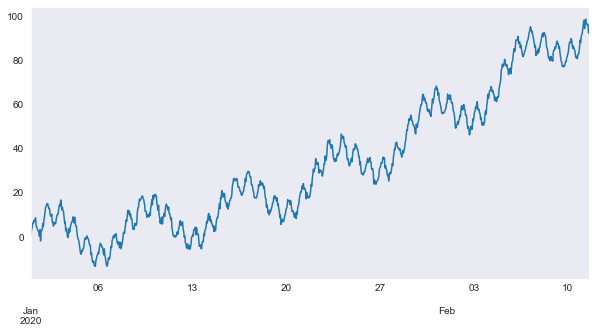

In [281]:
df["y"].plot(figsize=[10, 5]);

In [4]:
# make sure to have the latest statsmodels to have MSTL 
# use link https://www.statsmodels.org/dev/install.html
import statsmodels
print (statsmodels.__version__)

0.12.2


In [3]:
from statsmodels.tsa.seasonal import MSTL

mstl = MSTL(df["y"], periods=[24, 24 * 7])
res = mstl.fit()
res.plot()

ImportError: cannot import name 'MSTL' from 'statsmodels.tsa.seasonal' (C:\Users\20106\anaconda3\lib\site-packages\statsmodels\tsa\seasonal.py)

In [283]:
res.seasonal.head()


Month
1949-01-01   -11.022168
1949-02-01    -2.838617
1949-03-01     8.878317
1949-04-01     2.087211
1949-05-01    -6.443116
Name: season, dtype: float64

<a id='exp'></a>
# Smoothing Time Series with Exponential Smoothing

There are three key exponential smoothing techniques you need to be aware of:
1. Single Exponential Smoothing - no trend or seasonality
2. Double Exponential Smoothing - captures trend
3. Triple Exponential Smoothing - captures trend & seasonality

Exponential smoothing is a way to weight observations differently. Specifically, recent observations are weighted more so than more distant ones.

[statsmodel "ExponentialSmoothing" function parameters for a general function for single double triple](https://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.exponential_smoothing.ExponentialSmoothing.html#statsmodels.tsa.statespace.exponential_smoothing.ExponentialSmoothing)

Great Examples for Comparisons Must Read. [Exponential Smoothing Statsmodel doc Explanation and Examples](https://www.statsmodels.org/dev/examples/notebooks/generated/exponential_smoothing.html#)

<font color='Brwon'>**Let's try the below techniques on airline data and compare their MSE.**
 

In [16]:
def mse(observations, estimates):
    
    sq_diff = (observations - estimates) ** 2
    mse = np.sum(sq_diff)
    
    return mse

In [19]:
# train test split with respect to order
train_size = int(airline_df.shape[0] * 0.7)
airline_train_df, airline_test_df = daily_fem_births.iloc[:train_size,:] , daily_fem_births.iloc[train_size:, :]

In [21]:
airline_train_df

,Date,Births
0,1959-01-01,35
1,1959-01-02,32
2,1959-01-03,30
3,1959-01-04,31
4,1959-01-05,44
...,...,...
95,1959-04-06,33
96,1959-04-07,35
97,1959-04-08,38
98,1959-04-09,38


#### Single Exponential
This method is useful if your data lacks trend and seasonality and you want to approximately track patterns in your data. Furthermore, this method removes the lag associated with the moving average techniques discussed above. 

The formulation is this: $S_{t} = \alpha*y_{t-1} + (1-\alpha)S_{t-1}$

$S_{t}$ is the smoothed value at time *t*  
$\alpha$ is a smoothing constant  
$y_{t-1}$ is the value of the series at time *t-1*


In [27]:
airline_test_df

,Date,Births
100,1959-04-11,53
101,1959-04-12,34
102,1959-04-13,34
103,1959-04-14,38
104,1959-04-15,35
...,...,...
360,1959-12-27,37
361,1959-12-28,52
362,1959-12-29,48
363,1959-12-30,55


In [50]:
from statsmodels.tsa.api import SimpleExpSmoothing

single = SimpleExpSmoothing(airline_train_df.Births).fit(optimized=True)
single_preds = single.forecast()
single_mse = mse(airline_test_df.Births, single_preds)
print("Predictions: ", single_preds)
print("MSE: ", single_mse)
print("optimized smoothing constant: ", single.model.params["smoothing_level"])


Predictions:  100    39.54
dtype: float64
MSE:  181.17158803909075
optimized smoothing constant:  1.4901161193847656e-08


C:\Users\20106\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [43]:
from statsmodels.tsa.api import SimpleExpSmoothing

single = SimpleExpSmoothing(airline_train_df.Births).fit(optimized=False, smoothing_level=0.2)
single_preds = single.forecast()
single_mse = mse(airline_test_df.Births, single_preds)
print("Predictions: ", single_preds)
print("MSE: ", single_mse)

Predictions:  100    36.987624
dtype: float64
MSE:  256.39618417494256


In [44]:
from statsmodels.tsa.api import SimpleExpSmoothing

single = SimpleExpSmoothing(airline_train_df.Births).fit(optimized=False, smoothing_level=0.2)
single_preds = single.forecast(airline_test_df.shape[0])
single_mse = mse(airline_test_df.Births, single_preds)
print("Predictions: ", single_preds)
print("MSE: ", single_mse)

Predictions:  100    36.987624
101    36.987624
102    36.987624
103    36.987624
104    36.987624
         ...    
360    36.987624
361    36.987624
362    36.987624
363    36.987624
364    36.987624
Length: 265, dtype: float64
MSE:  22910.752619881743


In [53]:
from statsmodels.tsa.api import SimpleExpSmoothing

single = SimpleExpSmoothing(airline_train_df.Births, initialization_method= 'known',
                            initial_level=airline_train_df.Births.values[0])\
              .fit(optimized=False, smoothing_level=0.2)
single_preds = single.forecast(airline_test_df.shape[0])
single_mse = mse(airline_test_df.Births, single_preds)
print("Predictions: ", single_preds)
print("MSE: ", single_mse)

Predictions:  100    36.987624
101    36.987624
102    36.987624
103    36.987624
104    36.987624
         ...    
360    36.987624
361    36.987624
362    36.987624
363    36.987624
364    36.987624
Length: 265, dtype: float64
MSE:  22910.752619881743


In [62]:
airline_test_df.Date.shape

(265,)

Text(0.5, 1.0, 'Single Exponential Smoothing')

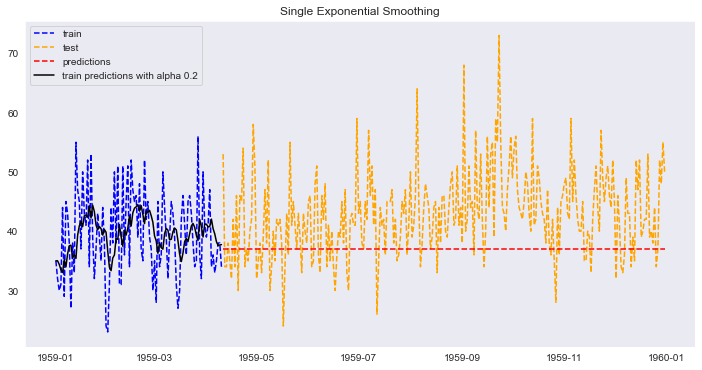

In [71]:
plt.figure(figsize=(12,6));

plt.plot(airline_train_df.Date, airline_train_df.Births, 'b--', label="train")
plt.plot(airline_test_df.Date, airline_test_df.Births, color='orange', linestyle="--", label="test")
plt.plot(airline_test_df.Date, single.predict(100,364), 'r--', label="predictions")
plt.plot(airline_train_df.Date, single.predict(0,99), 'black', label="train predictions with alpha " + 
                                                              str(single.model.params["smoothing_level"]));

plt.legend(loc='upper left')
plt.title("Single Exponential Smoothing")


#### Setting Alpha
One last comment: choosing the optimal value for $\alpha$ is also taken care of for you by **statsmodels**. A solver uses a metric like MSE to find an $\alpha$ that minimizes that metric. Therefore, you rarely have to choose this value yourself, but at least you have a basic idea as to what's happening under the hood.

#### Double Exponential 
Should your data exhibit a trend, you'll want to use this smoothing method. It has all the benefits of Single Exponential with the ability to pickup on trend. 

In [75]:
from statsmodels.tsa.api import  Holt
double = Holt(airline_train_df.Births).fit(optimized=True)
double_preds = single.forecast()
double_mse = mse(airline_test_df.Births, double_preds)
print("Predictions: ", double)
print("MSE: ", double_mse)
print("optimized smoothing constant: ", double.model.params["smoothing_level"])

Predictions:  <statsmodels.tsa.holtwinters.results.HoltWintersResultsWrapper object at 0x000001A13AF01BB0>
MSE:  256.39618417494256
optimized smoothing constant:  6.248056775311696e-06


In [77]:
from statsmodels.tsa.api import  Holt
double = Holt(airline_train_df.Births).fit(optimized=True)
double_preds = single.forecast(airline_test_df.shape[0])
double_mse = mse(airline_test_df.Births, double_preds)
print("Predictions: ", double)
print("MSE: ", double_mse)
print("optimized smoothing constant: ", double.model.params["smoothing_level"])

Predictions:  <statsmodels.tsa.holtwinters.results.HoltWintersResultsWrapper object at 0x000001A13B11A730>
MSE:  22910.752619881743
optimized smoothing constant:  6.248056775311696e-06


C:\Users\20106\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


Text(0.5, 1.0, 'Double Exponential Smoothing')

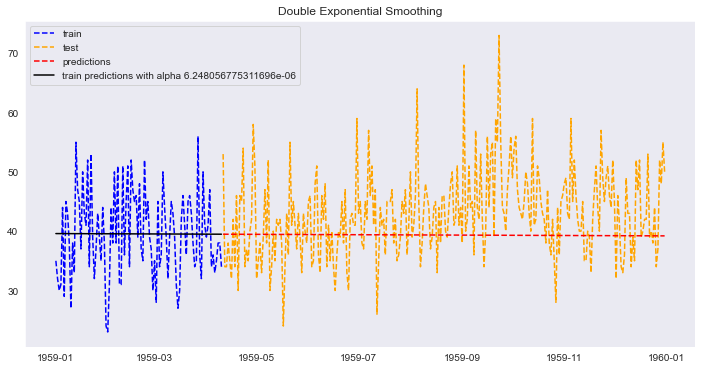

In [76]:
plt.figure(figsize=(12,6));

plt.plot(airline_train_df.Date, airline_train_df.Births, 'b--', label="train")
plt.plot(airline_test_df.Date, airline_test_df.Births, color='orange', linestyle="--", label="test")
plt.plot(airline_test_df.Date, double.predict(100,364), 'r--', label="predictions")
plt.plot(airline_train_df.Date,double.predict(0,99), 'black', label="train predictions with alpha " + 
                                                              str(double.model.params["smoothing_level"]));

plt.legend(loc='upper left')
plt.title("Double Exponential Smoothing")


#### Triple Exponential
Should your data exhibit trend and seasonality, you'll want to use this smoothing method. It has all the benefits of Double Exponential with the ability to pickup on seasonality. 

In [73]:
from statsmodels.tsa.api import ExponentialSmoothing # a general function for single double triple.

In [85]:
airline_df

,Month,Passengers,Date
0,1949-01,112,1949-01-01
1,1949-02,118,1949-02-01
2,1949-03,132,1949-03-01
3,1949-04,129,1949-04-01
4,1949-05,121,1949-05-01
...,...,...,...
139,1960-08,606,1960-08-01
140,1960-09,508,1960-09-01
141,1960-10,461,1960-10-01
142,1960-11,390,1960-11-01


In [86]:
triple = ExponentialSmoothing(airline_train_df.Births,
                              trend="additive",
                              seasonal="additive",
                              seasonal_periods=12).fit(optimized=True)
triple_preds = triple.forecast(airline_test_df.Births.shape[0])
triple_mse = mse(airline_test_df.Births, triple_preds)
print("Predictions: ", triple_preds)
print("MSE: ", triple_mse)

Predictions:  100    46.397825
101    40.647877
102    39.022914
103    41.647640
104    38.647997
         ...    
360    38.630308
361    42.853315
362    37.631433
363    35.852769
364    47.119441
Length: 265, dtype: float64
MSE:  17541.39238884572


C:\Users\20106\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


Text(0.5, 1.0, 'Triple Exponential Smoothing')

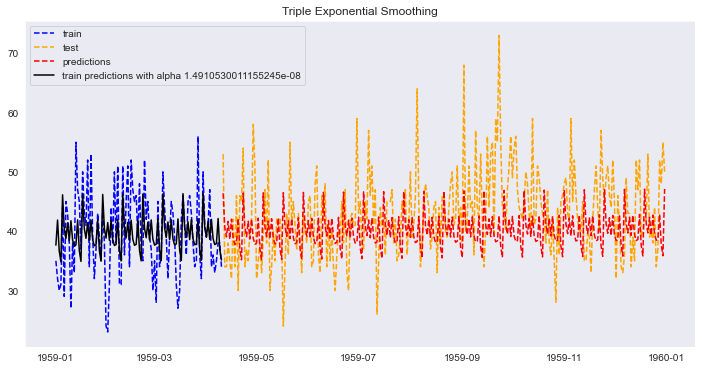

In [87]:
plt.figure(figsize=(12,6));

plt.plot(airline_train_df.Date, airline_train_df.Births, 'b--', label="train")
plt.plot(airline_test_df.Date, airline_test_df.Births, color='orange', linestyle="--", label="test")
plt.plot(airline_test_df.Date, triple.predict(100,364), 'r--', label="predictions")
plt.plot(airline_train_df.Date,triple.predict(0,99), 'black', label="train predictions with alpha " + 
                                                              str(triple.model.params["smoothing_level"]));

plt.legend(loc='upper left')
plt.title("Triple Exponential Smoothing")


In [89]:
data_dict = {'MSE':[single_mse, double_mse, triple_mse]}
mse_df = pd.DataFrame(data_dict, index=['single', 'double', 'triple'])
mse_df

,MSE
single,22910.752620
double,22910.752620
triple,17541.392389


<a id='dt'></a>
# Use and Remove Trends

Identifying and understanding trend information can aid in improving model performance;
below are a few reasons:
- **Faster Modeling:** Perhaps the knowledge of a trend or lack of a trend can suggest
methods and make model selection and evaluation more efficient.
- **Simpler Problem**: Perhaps we can correct or remove the trend to simplify modeling
and improve model performance.
- **More Data:** Perhaps we can use trend information, directly or as a summary, to provide
additional information to the model and improve model performance.


There are all kinds of trends. Two general classes that we may think about are:
- **Deterministic Trends:** These are trends that consistently increase or decrease.
- **Stochastic Trends:** These are trends that increase and decrease inconsistently.
In general, deterministic trends are easier to identify and remove, but the methods discussed
in this tutorial can still be useful for stochastic trends. We can think about trends in terms of
their scope of observations.
- **Global Trends:** These are trends that apply to the whole time series.
- **Local Trends:** These are trends that apply to parts or subsequences of a time series.
Generally, global trends are easier to identify and address.

These notes are from Dr.Jason Brownlee, Introduction to Time Series Forecasting With Python, Available from https://machinelearningmastery.com/introduction-to-time-series-forecasting-with-python/


The simplest method to detrend a time series is by differencing. `value(t)=obs(t)-obs(t-1)`

[pandas diff method - Calculate the Difference Between Pandas Rows](https://datagy.io/pandas-diff/)

In [31]:
shampoo_sales['Fd_Sales'] = shampoo_sales.Sales.diff(periods=1) # 1st difference with one lag
shampoo_sales.head()

,Month,Sales,Date,Fd_Sales
0,1901-01,266.0,1901-01-01,NaN
1,1901-02,145.9,1901-02-01,-120.1
2,1901-03,183.1,1901-03-01,37.2
3,1901-04,119.3,1901-04-01,-63.8
4,1901-05,180.3,1901-05-01,61.0


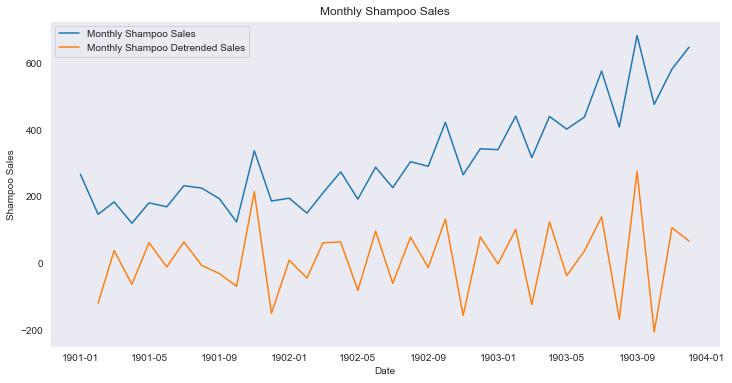

In [38]:
plt.figure(figsize=(12,6));
plt.plot(shampoo_sales.Date, shampoo_sales.Sales);
plt.plot(shampoo_sales.Date, shampoo_sales.Fd_Sales);
plt.xlabel('Date');
plt.ylabel('Shampoo Sales');
plt.title('Monthly Shampoo Sales');
plt.legend(['Monthly Shampoo Sales','Monthly Shampoo Detrended Sales']);

This approach works well for data with a linear trend. If the trend is quadratic (the change
in the trend also increases or decreases), then a difference of the already-differenced dataset can
be taken, a second level of differencing. This process can be further repeated if needed. Because
differencing only requires the observation at the previous time step, it can easily be applied to
unseen out-of-sample data to either pre-process or provide an additional input for supervised
learning.

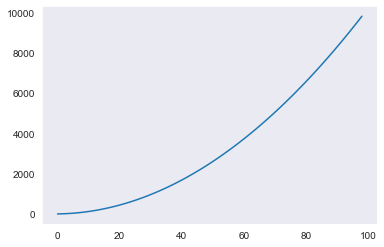

In [45]:
import random
#generate a series with non linear trend without random noise
series = [i**2 for i in range(1,100)]
series = pd.Series(series)
series.plot();

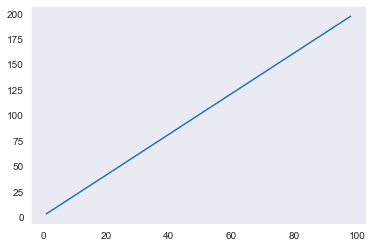

In [46]:
series_fd = series.diff(periods=1)
series_fd.plot();

In [49]:
series_fd

0       NaN
1       3.0
2       5.0
3       7.0
4       9.0
      ...  
94    189.0
95    191.0
96    193.0
97    195.0
98    197.0
Length: 99, dtype: float64

In [48]:
series_sd

0     NaN
1     NaN
2     2.0
3     2.0
4     2.0
     ... 
94    2.0
95    2.0
96    2.0
97    2.0
98    2.0
Length: 99, dtype: float64

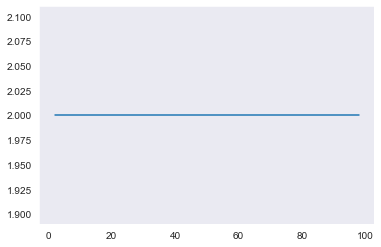

In [47]:
series_sd = series_fd.diff(periods=1)
series_sd.plot();

#### Detrend by Model Fitting
- A trend is often easily visualized as a line through the observations. Linear trends can be
summarized by a linear model, and nonlinear trends may be best summarized using a polynomial
or other curve-fitting method. 

- Because of the subjective and domain-specific nature of identifying
trends, this approach can help to identify whether a trend is present. Even fitting a linear model
to a trend that is clearly super-linear or exponential can be helpful.

- In addition to being used as a trend identification tool, these fit models can also be used to
detrend a time series. For example, a linear model can be fit on the time index to predict the
observation.

These notes are from Dr.Jason Brownlee, Introduction to Time Series Forecasting With Python, Available from https://machinelearningmastery.com/introduction-to-time-series-forecasting-with-python/

In [59]:
# fit a linear model to the data

from sklearn.linear_model import LinearRegression

# generate time index t where t represents days
shampoo_sales['t'] = np.arange(0,shampoo_sales.shape[0])
model = LinearRegression()
model.fit(shampoo_sales['t'].values.reshape(-1, 1),shampoo_sales['Sales'].values)

trend = model.predict(shampoo_sales['t'].values.reshape(-1, 1))

shampoo_sales['fitted_line_trend_values'] = trend

shampoo_sales['detrended_model_fit'] = shampoo_sales.Sales - shampoo_sales.fitted_line_trend_values

shampoo_sales.head()

,Month,Sales,Date,Fd_Sales,t,fitted_line_trend_values,detrended_model_fit
0,1901-01,266.0,1901-01-01,NaN,0,101.216216,164.783784
1,1901-02,145.9,1901-02-01,-120.1,1,113.295290,32.604710
2,1901-03,183.1,1901-03-01,37.2,2,125.374363,57.725637
3,1901-04,119.3,1901-04-01,-63.8,3,137.453436,-18.153436
4,1901-05,180.3,1901-05-01,61.0,4,149.532510,30.767490


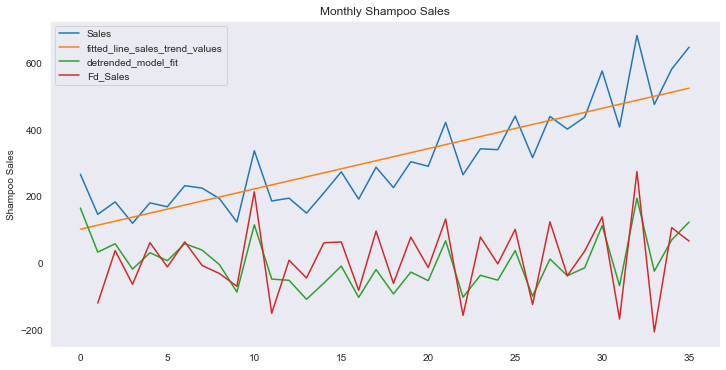

In [66]:
plt.figure(figsize=(12,6));

plt.plot(shampoo_sales.Sales)
plt.plot(shampoo_sales.fitted_line_trend_values)
plt.plot(shampoo_sales.detrended_model_fit)
plt.plot(shampoo_sales.Fd_Sales)
plt.ylabel('Shampoo Sales');
plt.title('Monthly Shampoo Sales');
plt.legend(['Monthly Shampoo Sales','Monthly Shampoo Detrended Sales']);
plt.legend(['Sales', 'fitted_line_sales_trend_values', 'detrended_model_fit', 'Fd_Sales']);
#plt.savefig('1.pdf') # save it as pdf figure for the highest quality

We can see that this approach has effectively detrended the dataset. There may be a
parabola in the residuals, suggesting that perhaps a polynomial fit may have done a better job.
Because the trend model takes only the integer index of the observation as input, it can be used
on new data to either detrend or provide a new input variable for the model.


<a id='ds'></a>
# Use and Remove Seasonality

Understanding the seasonal component in time series can improve the performance of modeling
with machine learning. This can happen in two main ways:
    
- **Clearer Signal:** Identifying and removing the seasonal component from the time series can
result in a clearer relationship between input and output variables.
- **More Information:** Additional information about the seasonal component of the time
series can provide new information to improve model performance.

Both approaches may be useful on a project. Modeling seasonality and removing it from the
time series may occur during data cleaning and preparation. Extracting seasonal information
and providing it as input features, either directly or in summary form, may occur during feature
extraction and feature engineering activities.


#### Types of seasonality:
- Time of Day.
- Daily.
- Weekly.
- Monthly.
- Yearly.

As such, identifying whether there is a seasonality component in your time series problem is
subjective. The simplest approach to determining if there is an aspect of seasonality is to plot
and review your data, perhaps at different scales and with the addition of trend lines.


#### Removing Seasonality:
Once seasonality is identified, it can be modeled. The model of seasonality can be removed from
the time series. This process is called Seasonal Adjustment, or Deseasonalizing. A time series
where the seasonal component has been removed is called seasonal stationary. A time series
with a clear seasonal component is referred to as non-stationary.

There are sophisticated methods to study and extract seasonality from time series in the field
of Time Series Analysis. As we are primarily interested in predictive modeling and time series
forecasting, we are limited to methods that can be developed on historical data and available
when making predictions on new data. In this tutorial, we will look at two methods for making
seasonal adjustments on a classical meteorological-type problem of daily temperatures with a
strong additive seasonal component.

These notes are from Dr.Jason Brownlee, Introduction to Time Series Forecasting With Python, Available from https://machinelearningmastery.com/introduction-to-time-series-forecasting-with-python/

In [68]:
daily_min_temp.head()

,Date,Temp
0,1981-01-01,20.7
1,1981-01-02,17.9
2,1981-01-03,18.8
3,1981-01-04,14.6
4,1981-01-05,15.8


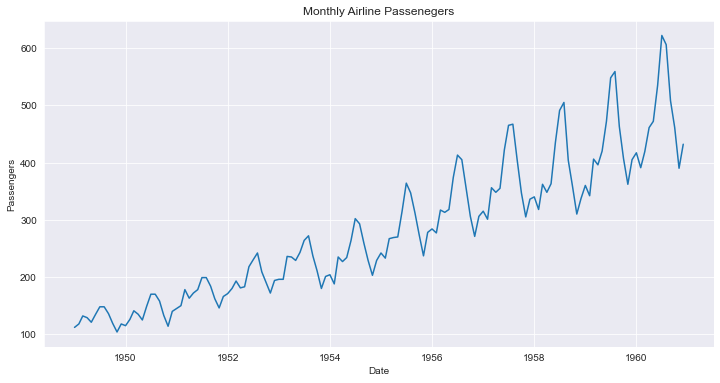

In [70]:
plt.figure(figsize=(12,6));
plt.plot(airline_df.Date, airline_df.Passengers);
plt.xlabel('Date');
plt.ylabel('Passengers');
plt.title('Monthly Airline Passenegers');
plt.grid()

In [71]:
# to remove monthly seasonality we apply first difference with lag = 12

airline_df['fd_lag_12'] = airline_df.Passengers.diff(periods=12)
airline_df

,Month,Passengers,Date,fd_lag_12
0,1949-01,112,1949-01-01,NaN
1,1949-02,118,1949-02-01,NaN
2,1949-03,132,1949-03-01,NaN
3,1949-04,129,1949-04-01,NaN
4,1949-05,121,1949-05-01,NaN
...,...,...,...,...
139,1960-08,606,1960-08-01,47.0
140,1960-09,508,1960-09-01,45.0
141,1960-10,461,1960-10-01,54.0
142,1960-11,390,1960-11-01,28.0


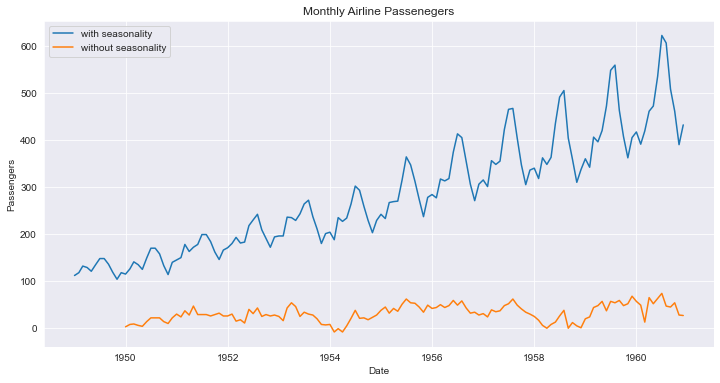

In [74]:
plt.figure(figsize=(12,6));
plt.plot(airline_df.Date, airline_df.Passengers);
plt.plot(airline_df.Date, airline_df.fd_lag_12);
plt.xlabel('Date');
plt.ylabel('Passengers');
plt.title('Monthly Airline Passenegers');
plt.grid();
plt.legend(['with seasonality', 'without seasonality']);

#### Seasonal Adjustment with Modeling
We can model the seasonal component directly, then subtract it from the observations. The
seasonal component in a given time series is likely a sine wave over a generally fixed period and
amplitude. This can be approximated easily using a curve-fitting method.

Once fit, the model can then be used to calculate a seasonal component for any time index.

The curve can then be used as a new input for modeling with
supervised learning algorithms, or subtracted from observations to create a seasonally adjusted
series.

For consistent sine wave-like seasonality, a 4th order or 5th order polynomial will
be sufficient. In this case, I chose an order of 4 by trial and error.

In [97]:
# fit a linear model to the data

from sklearn.linear_model import LinearRegression
# generate time index t
airline_df['t'] = np.arange(0, airline_df.shape[0])
model = LinearRegression()
model.fit(airline_df['t'].values.reshape(-1, 1),airline_df['Passengers'].values)

airline_df['fitted_curve_values'] = model.predict(airline_df['t'].values.reshape(-1, 1))
 
airline_df
airline_df['deseasonalized_model_fit'] = airline_df.Passengers - airline_df.fitted_curve_values

airline_df.head()

,Month,Passengers,Date,fd_lag_12,t,fitted_curve_values,deseasonalized_model_fit
0,1949-01,112,1949-01-01,NaN,0,90.309962,21.690038
1,1949-02,118,1949-02-01,NaN,1,92.967146,25.032854
2,1949-03,132,1949-03-01,NaN,2,95.624330,36.375670
3,1949-04,129,1949-04-01,NaN,3,98.281513,30.718487
4,1949-05,121,1949-05-01,NaN,4,100.938697,20.061303


In [130]:
# fit a non-linear model to the data

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
# generate time index t where t represents each month
airline_df['t'] = np.arange(0, airline_df.shape[0])

model = LinearRegression()
poly_feat = PolynomialFeatures(degree=20)
t_poly = poly_feat.fit_transform(airline_df['t'].values.reshape(-1, 1))

model.fit(t_poly, airline_df['Passengers'].values)

airline_df['fitted_curve_values'] = model.predict(t_poly)
 
airline_df

airline_df['deseasonalized_model_fit'] = airline_df.Passengers - airline_df.fitted_curve_values

airline_df.head()

,Month,Passengers,Date,fd_lag_12,t,fitted_curve_values,deseasonalized_model_fit
0,1949-01,112,1949-01-01,NaN,0,198.168846,-86.168846
1,1949-02,118,1949-02-01,NaN,1,198.168846,-80.168846
2,1949-03,132,1949-03-01,NaN,2,198.168846,-66.168846
3,1949-04,129,1949-04-01,NaN,3,198.168846,-69.168846
4,1949-05,121,1949-05-01,NaN,4,198.168846,-77.168846


<font color='red'> Polynomial regression provided very poor fit!

lets check numpy [polyfit doc](https://numpy.org/doc/stable/reference/generated/numpy.polyfit.html)

In [122]:
from numpy import polyfit
# fit polynomial: x^2*b1 + x*b2 + ... + bn

# generate time index t where t represents each month
airline_df['t'] = np.arange(0, airline_df.shape[0])

degree = 4
coefficents = polyfit(airline_df['t'].values, y, degree)

# create curve
curve = list()
for i in range(airline_df.shape[0]):
    value = coefficents[-1]
    for d in range(degree):
        value += t[i]**(degree-d) * coefficents[d]
    curve.append(value)

In [113]:
# # lets model a sin wave
# t = np.arange(0, airline_df.shape[0])
# y = 50*np.sin(0.2*t) + 3*t + 10

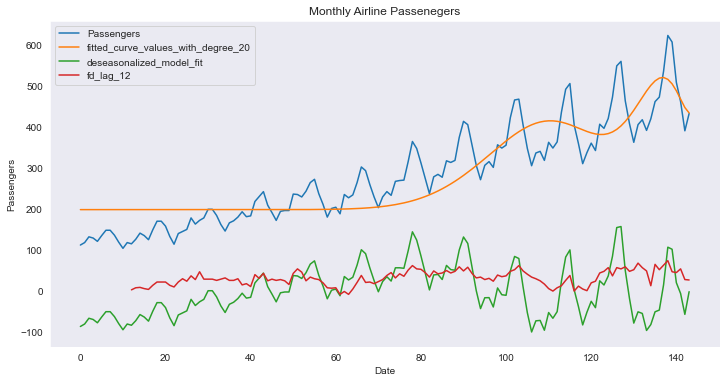

In [133]:
plt.figure(figsize=(12,6));

plt.plot(airline_df.Passengers)
plt.plot(airline_df.fitted_curve_values)
plt.plot(airline_df.deseasonalized_model_fit)
plt.plot(airline_df.fd_lag_12)
plt.xlabel('Date');
plt.ylabel('Passengers');
plt.title('Monthly Airline Passenegers');
plt.legend(['Passengers', 'fitted_curve_values_with_degree_20', 'deseasonalized_model_fit', 'fd_lag_12']);
plt.savefig('1.pdf') # save it as pdf figure for the highest quality

Let's try on minimum temperature dataset P.140  Dr.Jason Brownlee, Introduction to Time Series Forecasting With Python, Available from https://machinelearningmastery.com/introduction-to-time-series-forecasting-with-python/

<a id='stationarity'></a>
# Stationarity in Time Series

In order for time series data to be stationary, the data must exhibit four properties over time:
1. constant mean
2. constant variance
3. constant autocorrelation structure
4. no periodic component


Time series is different from more traditional classification and regression predictive modeling
problems. The temporal structure adds an order to the observations. This imposed order means
that important assumptions about the consistency of those observations needs to be handled
specifically. 

For example, when modeling, there are assumptions that the summary statistics of
observations are consistent. In time series terminology, we refer to this expectation as the time
series being stationary. These assumptions can be easily violated in time series by the addition
of a trend, seasonality, and other time-dependent structures.

The observations in a stationary time series are not dependent on time. Time series are stationary
if they do not have trend or seasonal effects. Summary statistics calculated on the time series
are consistent over time, like the mean or the variance of the observations. When a time series
is stationary, it can be easier to model. Statistical modeling methods assume or require the
time series to be stationary to be effective

#### Types of Stationary Time Series
Stationary Process: A process that generates a stationary series of observations.
- **Stationary Model:** A model that describes a stationary series of observations.
- **Trend Stationary:** A time series that does not exhibit a trend.
- **Seasonal Stationary:** A time series that does not exhibit seasonality.
- **Strictly Stationary:** A mathematical definition of a stationary process, specifically that
the joint distribution of observations is invariant to time shift.

#### Checks for Stationarity

There are many methods to check whether a time series (direct observations, residuals, otherwise)
is stationary or non-stationary.
- **Look at Plots:** You can review a time series plot of your data and visually check if there
are any obvious trends or seasonality.
- **Summary Statistics:** You can review the summary statistics for your data for seasons
or random partitions and check for obvious or significant differences.
- **Statistical Tests:** You can use statistical tests to check if the expectations of stationarity
are met or have been violated.

#### 1. Run-Sequence Plots


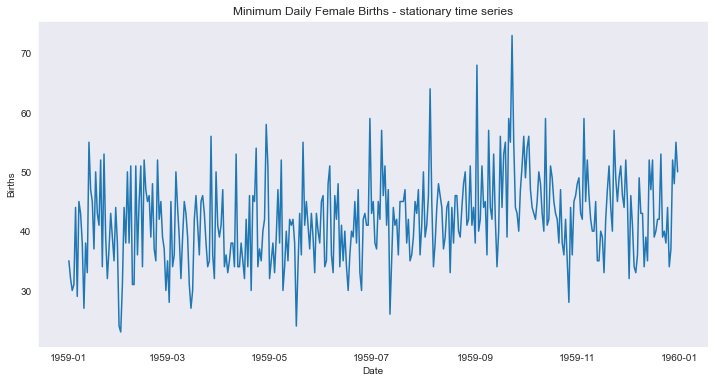

In [135]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births.Date, daily_fem_births.Births);
plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births - stationary time series');

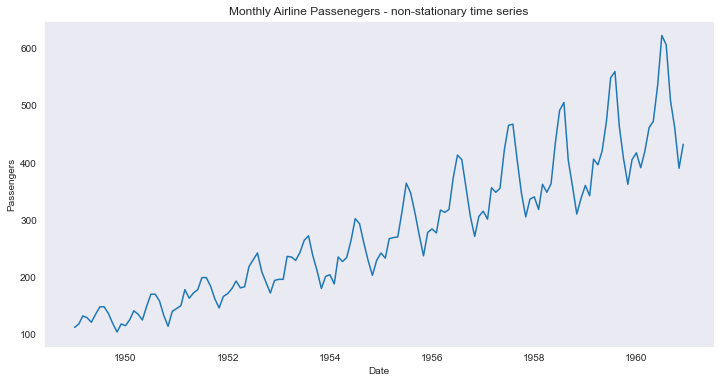

In [136]:
plt.figure(figsize=(12,6));
plt.plot(airline_df.Date, airline_df.Passengers);
plt.xlabel('Date');
plt.ylabel('Passengers');
plt.title('Monthly Airline Passenegers - non-stationary time series');

##### Histogram Plot

Plotting a histogram of the time series gives important clues into its underlying structure. A **Normal distribution** gives confidence that mean and variance are constant. It's certainly not definitive but gives you a good indication. 

**Uniform** or **Skewed distributions** may indicate non stationarity.

Running the below plots a histogram of values from the time series. 



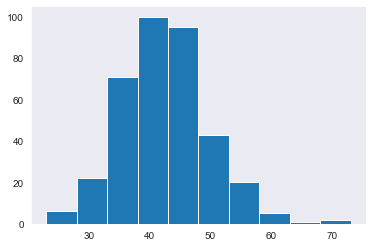

In [140]:
plt.hist(daily_fem_births.Births);

<font color='green'> We clearly see the bell curve-like shape of the Gaussian distribution, perhaps with a longer right tail. therefore the mean and variance values are less meaningful. **"stationary"**

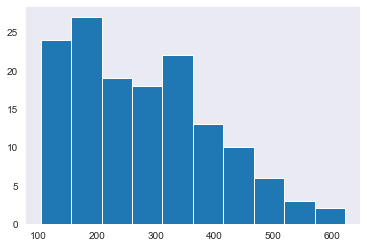

In [138]:
plt.hist(airline_df.Passengers);

<font color='red'> We clearly don't see the bell curve-like shape of the Gaussian distribution. **"Non-stationary"**
    


<font color='red'>Reviewing the plot of the time series again, we can see that there is an obvious seasonality
component, and it looks like the seasonality component is growing. This may suggest an
exponential growth from season to season. 
    


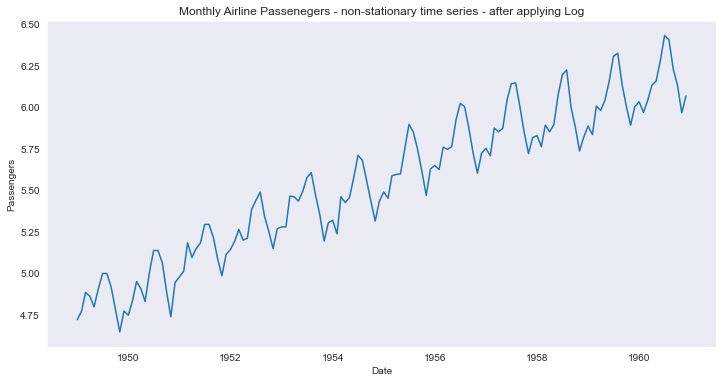

In [157]:
plt.figure(figsize=(12,6));
plt.plot(airline_df.Date, np.log(airline_df.Passengers));
plt.xlabel('Date');
plt.ylabel('Passengers');
plt.title('Monthly Airline Passenegers - non-stationary time series - after applying Log');

<font color='red'> A log transform can be used to flatten out exponential
change back to a linear relationship. but we still have
a trend and seasonal elements.

#### 2. Summary Statistics & Plots


Next, we can split the time series into two contiguous sequences. We can then calculate the
mean and variance of each group of numbers and compare the values.


In [151]:
# let's split the daily female birth data into two chunks

X = daily_fem_births.Births.values
split = int(len(X) / 2)
X1, X2 = X[:split], X[split:]
print('mean1=%.2f, mean2=%.2f' % (X1.mean(), X.mean()))
print('variance1=%.2f, variance2=%.2f' % (X1.var(), X2.var()))

mean1=39.76, mean2=41.98
variance1=49.21, variance2=48.71


<font color='green'> The mean and variance are slightly different. **"stationary"**

In [152]:
# let's split the airline passenger data into two chunks

X = airline_df.Passengers.values
split = int(len(X) / 2)
X1, X2 = X[:split], X[split:]
print('mean1=%.2f, mean2=%.2f' % (X1.mean(), X.mean()))
print('variance1=%.2f, variance2=%.2f' % (X1.var(), X2.var()))

mean1=182.90, mean2=280.30
variance1=2244.09, variance2=7367.96


<font color='red'> The mean and variance are highly different. **"Non-stationary"**

In [158]:
# let's split the log of airline passenger data into two chunks

X = np.log(airline_df.Passengers.values)
split = int(len(X) / 2)
X1, X2 = X[:split], X[split:]
print('mean1=%.2f, mean2=%.2f' % (X1.mean(), X.mean()))
print('variance1=%.2f, variance2=%.2f' % (X1.var(), X2.var()))

mean1=5.18, mean2=5.54
variance1=0.07, variance2=0.05


<font color='red'> The mean and variance are not highly different at all, but it still suffer from trend a seasonal elements. **"Non-stationary"**. It is stationary in variance but still not stationary in trend or seasonality.
    
<font color='blue'>This was tricky to identify, so statistical tests can come and help

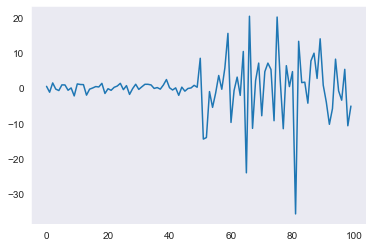

#### 3. Augmented Dickey-Fuller test

This is a statistical procedure to suss out whether a time series is stationary or not:
1. **Null hypothesis:** the series is nonstationary.
2. **Alternative hypothesis:** the series is stationary.

Like any statistical test you should set a significance level or threshold that determines whether you should accept or reject the null. 
> The value 0.05 is common but depends upons numerous factors.

Let's see how to run this test in Python.

[Augmented Dickey-Fuller test in statsmodels docs](http://www.statsmodels.org/stable/generated/statsmodels.tsa.stattools.adfuller.html)

In [165]:
# airline passenger data
from statsmodels.tsa.stattools import adfuller
adf = adfuller(airline_df.Passengers)

print('ADF Statistic: %f' % adf[0])
print('p-value: %f' % adf[1])
print('Critical Values:')
for key, value in adf[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: 0.815369
p-value: 0.991880
Critical Values:
	1%: -3.482
	5%: -2.884
	10%: -2.579


<font color='red'> Non-Stationary as we failed to reject Null

In [170]:
adf

(-1.717017089106961,
 0.4223667747703911,
 13,
 130,
 {'1%': -3.4816817173418295,
  '5%': -2.8840418343195267,
  '10%': -2.578770059171598},
 -445.3990312497209)

First, **adf** is the value of the test statistic. The more negative the value, the more confident we can be that the series is stationary. That may not mean anything to you just yet but the **pvalue** should


Next, **pvalue** is interpreted like any p-value. Once we set a threshold, we can compare this p-value to that threshold.

Finally, the **critical_values** variable provides test statistic threholds for common significant levels.

In [169]:
# log of airline passenger data 

adf = adfuller(np.log(airline_df.Passengers))

print('ADF Statistic: %f' % adf[0])
print('p-value: %f' % adf[1])
print('Critical Values:')
for key, value in adf[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.717017
p-value: 0.422367
Critical Values:
	1%: -3.482
	5%: -2.884
	10%: -2.579


<font color='brown'>detected that log of airline passenger data is not stationary and it prevented by being fooled from the numerical comparison of the mean and variance of splits.

In [167]:
# Daily female birth data
from statsmodels.tsa.stattools import adfuller
adf = adfuller(daily_fem_births.Births)

print('ADF Statistic: %f' % adf[0])
print('p-value: %f' % adf[1])
print('Critical Values:')
for key, value in adf[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.808291
p-value: 0.000052
Critical Values:
	1%: -3.449
	5%: -2.870
	10%: -2.571


<font color='green'> Stationary as we rejected Null hypothesis.

<a id='eval'></a>
# Model Evaluation

The goal of time series forecasting is to make accurate predictions about the future. The fast
and powerful methods that we rely on in machine learning, such as using train-test splits and
k-fold cross-validation, do not work in the case of time series data. This is because they ignore
the temporal components inherent in the problem.


In applied machine learning, we often split our data into a train and a test set: the training
set used to prepare the model and the test set used to evaluate it. We may even use k-fold
cross-validation that repeats this process by systematically splitting the data into k groups,
each given a chance to be a held out model.


These methods cannot be directly used with time series data. This is because they assume
that there is no relationship between the observations, that each observation is independent.

This is not true of time series data, where the time dimension of observations means that
we cannot randomly split them into groups. Instead, we must split data up and respect the
temporal order in which values were observed.

In time series forecasting, this evaluation of models on historical data is called **backtesting**.

We will look at three different methods that you can use to backtest your machine
learning models on time series problems. They are:
1. Train-Test split that respect temporal order of observations.
2. Multiple Train-Test splits that respect temporal order of observations.
3. Walk-Forward Validation where a model may be updated each time step new data is
received.


These notes are from Dr.Jason Brownlee, Introduction to Time Series Forecasting With Python, Available from https://machinelearningmastery.com/introduction-to-time-series-forecasting-with-python/

#### 1. Train-Test Split

In [185]:
sunspots_df.shape

(2820, 2)

In [182]:
# train test split with respect to order
train_size = int(sunspots_df.shape[0] * 0.7)
sunspots_df_train, sunspots_df_test = sunspots_df.iloc[:train_size,:] , sunspots_df.iloc[train_size:, :]

In [183]:
sunspots_df_train.shape

(1973, 2)

In [184]:
sunspots_df_test.shape

(847, 2)

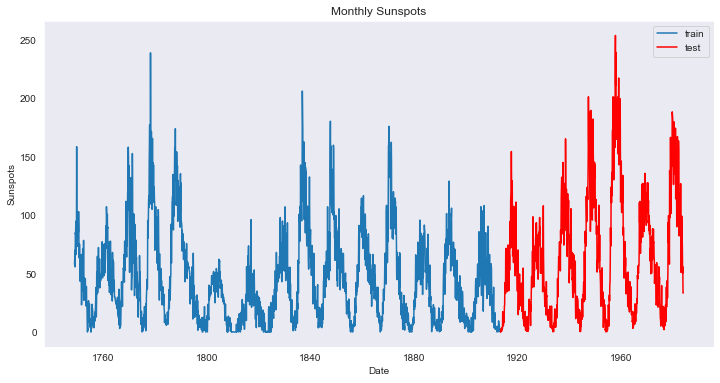

In [188]:
plt.figure(figsize=(12,6));
plt.plot(sunspots_df_train.Month, sunspots_df_train.Sunspots);
plt.plot(sunspots_df_test.Month, sunspots_df_test.Sunspots, color='red');
plt.xlabel('Date');
plt.ylabel('Sunspots');
plt.title('Monthly Sunspots');
plt.legend(['train', 'test']);

#### 2. Multiple Train-Test Splits

We can repeat the process of splitting the time series into train and test sets multiple times.
This will require multiple models to be trained and evaluated, but this additional computational
expense will provide a more robust estimate of the expected performance of the chosen method
and configuration on unseen data. We could do this manually by repeating the process described
in the previous section with different split points.


Alternately, the scikit-learn library provides this capability for us in the `TimeSeriesSplit`
object. You must specify the number of splits to create and the `TimeSeriesSplit` to return the
indexes of the train and test observations for each requested split.

check [sklearn docs for TimeSeriesSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html)

Time Series cross-validator

Provides train/test indices to split time series data samples that are observed at fixed time intervals, in train/test sets. In each split, test indices must be higher than before, and thus shuffling in cross validator is inappropriate.

This cross-validation object is a variation of KFold. In the kth split, it returns first k folds as train set and the (k+1)th fold as test set.

Note that unlike standard cross-validation methods, successive training sets are supersets of those that come before them.

In [189]:
pip install latexify-py

Note: you may need to restart the kernel to use updated packages.


In [211]:
import latexify
import math

@latexify.with_latex
def training_size(splitNumber, numberofsamples, numberofsplits):
    return (splitNumber * (numberofsamples / (numberofsplits + 1))) + numberofsamples % (numberofsplits + 1)
     

training_size

<latexify.core.with_latex.<locals>._LatexifiedFunction at 0x1beb7623220>

In [220]:
@latexify.with_latex
def test_index(numberofsamples, numberofsplits):
    return (numberofsamples / (numberofsplits + 1))

test_size

<latexify.core.with_latex.<locals>._LatexifiedFunction at 0x1beba274f40>

This means that  the first `training_size` records are used for training and the next `test_size` records are used for testing.


In [225]:
# 1st split size
print("1st split train size", training_size(1,sunspots_df.shape[0],3))
print("2nd split train size", training_size(2,sunspots_df.shape[0],3))
print("3rd split train size", training_size(3,sunspots_df.shape[0],3))
print('-------------------------------------------------------------')

print("1st split test size", test_size(sunspots_df.shape[0],1))
print("2nd split test size", test_size(sunspots_df.shape[0],2))
print("3rd split test size", test_size(sunspots_df.shape[0],3))

print('-------------------------------------------------------------')

print("1st split test size", training_size(2,sunspots_df.shape[0],3) - training_size(1,sunspots_df.shape[0],3))
print("2nd split test size", training_size(3,sunspots_df.shape[0],3) - training_size(2,sunspots_df.shape[0],3))
print("3rd split test size", sunspots_df.shape[0] - training_size(3,sunspots_df.shape[0],3))

1st split train size 705.0
2nd split train size 1410.0
3rd split train size 2115.0
-------------------------------------------------------------
1st split test size 1410.0
2nd split test size 940.0
3rd split test size 705.0
-------------------------------------------------------------
1st split test size 705.0
2nd split test size 705.0
3rd split test size 705.0


In [218]:
from sklearn.model_selection import TimeSeriesSplit

splits = TimeSeriesSplit(n_splits=3)

X = sunspots_df.Sunspots.values

for train_index, test_index in splits.split(X):
    train = X[train_index]
    test = X[test_index]
    print('Observations: %d' % (len(train) + len(test)))
    print('Training Observations: %d' % (len(train)))
    print('Testing Observations: %d' % (len(test)))


Observations: 1410
Training Observations: 705
Testing Observations: 705
Observations: 2115
Training Observations: 1410
Testing Observations: 705
Observations: 2820
Training Observations: 2115
Testing Observations: 705


Using multiple train-test splits will result in more models being trained, and in turn, <font color='green'> a
more accurate estimate of the performance of the models on unseen data. <font color='red'> A limitation of the
train-test split approach is that the trained models remain fixed as they are evaluated on each
evaluation in the test set. <font color='black'> This may not be realistic as models can be retrained as new daily or
monthly observations are made available.

#### 3. Walk (Roll) Forward Validation

In practice, we very likely will retrain our model as new data becomes available. This would
give the model the best opportunity to make good forecasts at each time step. We can evaluate
our machine learning models under this assumption. There are few decisions to make:

1. **Minimum Number of Observations.** First, we must select the minimum number of
observations required to train the model. This may be thought of as the window width if
a sliding window is used (see next point).
2. **Sliding or Expanding Window.** Next, we need to decide whether the model will
be trained on all data it has available or only on the most recent observations. This
determines whether a sliding or expanding window will be used.
After a sensible configuration is chosen for your test-setup, models can be trained and
evaluated.


1. Starting at the beginning of the time series, the minimum number of samples in the
window is used to train a model.
2. The model makes a prediction for the next time step.
3. The prediction is stored or evaluated against the known value.
4. The window is expanded to include the known value and the process is repeated (go to
step 1.)

Because this methodology involves moving along the time series one-time step at a time, it is
often called "Walk Forward Testing" or "Walk Forward Validation". Additionally, because a sliding
or expanding window is used to train a model, this method is also referred to as Rolling Window
Analysis or a Rolling Forecast. This capability is `currently not available in scikit-learn`, although
you could contrive the same effect with a carefully configured TimeSeriesSplit. 

These notes are from Dr.Jason Brownlee, Introduction to Time Series Forecasting With Python, Available from https://machinelearningmastery.com/introduction-to-time-series-forecasting-with-python/

In [229]:
# walk forward evaluation model for time series data

X = sunspots_df.Sunspots.values
window_train_size = 500 # define initial training window
tot_obs = len(X) # total obs
for i in range(window_train_size, tot_obs):
    train, test = X[0:i], X[i:i+1]  # here we have an expanding window
    print('train=%d, test=%d' % (len(train), len(test)))


train=500, test=1
train=501, test=1
train=502, test=1
train=503, test=1
train=504, test=1
train=505, test=1
train=506, test=1
train=507, test=1
train=508, test=1
train=509, test=1
train=510, test=1
train=511, test=1
train=512, test=1
train=513, test=1
train=514, test=1
train=515, test=1
train=516, test=1
train=517, test=1
train=518, test=1
train=519, test=1
train=520, test=1
train=521, test=1
train=522, test=1
train=523, test=1
train=524, test=1
train=525, test=1
train=526, test=1
train=527, test=1
train=528, test=1
train=529, test=1
train=530, test=1
train=531, test=1
train=532, test=1
train=533, test=1
train=534, test=1
train=535, test=1
train=536, test=1
train=537, test=1
train=538, test=1
train=539, test=1
train=540, test=1
train=541, test=1
train=542, test=1
train=543, test=1
train=544, test=1
train=545, test=1
train=546, test=1
train=547, test=1
train=548, test=1
train=549, test=1
train=550, test=1
train=551, test=1
train=552, test=1
train=553, test=1
train=554, test=1
train=555,

In [232]:
# walk forward evaluation model for time series data

X = sunspots_df.Sunspots.values
window_train_size = 500 # define initial training window
tot_obs = len(X) # total obs
w = 0 # sliding_window_counter
for i in range(window_train_size, tot_obs):
    train, test = X[w:i], X[i:i+1]  # here we have a sliding window
    w = w + 1
    #print(i,w)
    print('train=%d, test=%d' % (len(train), len(test))) # the length of training will always be of size window_train

500 1
train=500, test=1
501 2
train=500, test=1
502 3
train=500, test=1
503 4
train=500, test=1
504 5
train=500, test=1
505 6
train=500, test=1
506 7
train=500, test=1
507 8
train=500, test=1
508 9
train=500, test=1
509 10
train=500, test=1
510 11
train=500, test=1
511 12
train=500, test=1
512 13
train=500, test=1
513 14
train=500, test=1
514 15
train=500, test=1
515 16
train=500, test=1
516 17
train=500, test=1
517 18
train=500, test=1
518 19
train=500, test=1
519 20
train=500, test=1
520 21
train=500, test=1
521 22
train=500, test=1
522 23
train=500, test=1
523 24
train=500, test=1
524 25
train=500, test=1
525 26
train=500, test=1
526 27
train=500, test=1
527 28
train=500, test=1
528 29
train=500, test=1
529 30
train=500, test=1
530 31
train=500, test=1
531 32
train=500, test=1
532 33
train=500, test=1
533 34
train=500, test=1
534 35
train=500, test=1
535 36
train=500, test=1
536 37
train=500, test=1
537 38
train=500, test=1
538 39
train=500, test=1
539 40
train=500, test=1
540 41
tr

1729 1230
train=500, test=1
1730 1231
train=500, test=1
1731 1232
train=500, test=1
1732 1233
train=500, test=1
1733 1234
train=500, test=1
1734 1235
train=500, test=1
1735 1236
train=500, test=1
1736 1237
train=500, test=1
1737 1238
train=500, test=1
1738 1239
train=500, test=1
1739 1240
train=500, test=1
1740 1241
train=500, test=1
1741 1242
train=500, test=1
1742 1243
train=500, test=1
1743 1244
train=500, test=1
1744 1245
train=500, test=1
1745 1246
train=500, test=1
1746 1247
train=500, test=1
1747 1248
train=500, test=1
1748 1249
train=500, test=1
1749 1250
train=500, test=1
1750 1251
train=500, test=1
1751 1252
train=500, test=1
1752 1253
train=500, test=1
1753 1254
train=500, test=1
1754 1255
train=500, test=1
1755 1256
train=500, test=1
1756 1257
train=500, test=1
1757 1258
train=500, test=1
1758 1259
train=500, test=1
1759 1260
train=500, test=1
1760 1261
train=500, test=1
1761 1262
train=500, test=1
1762 1263
train=500, test=1
1763 1264
train=500, test=1
1764 1265
train=500,

You can see that many more models are created. This has the benefit again of providing a
much more robust estimation of how the chosen modeling method and parameters will perform
in practice. This improved estimate comes at the computational cost of creating so many models.
This is not expensive if the modeling method is simple or dataset is small (as in this example),
but could be an issue at scale. 

In the above case, 2,820 models would be created and evaluated.
As such, careful attention needs to be paid to the window width and window type. These could
be adjusted to contrive a test harness on your problem that is significantly less computationally
expensive. Walk-forward validation is the gold standard of model evaluation. It is the k-fold
cross-validation of the time series world and is recommended for your own projects.


<a id='naive'></a>
# Naive Forecasting (Baseline Model)

In [250]:
from sklearn.metrics import mean_squared_error

shampoo_sales['t+1'] = shampoo_sales.Sales.shift(-1)
shampoo_sales


# Naive predictor
shampoo_sales['naive_pred'] = shampoo_sales.Sales

# train test split with respect to order
train_size = int(shampoo_sales.shape[0] * 0.7)
shampoo_sales_train, shampoo_sales_test = shampoo_sales.iloc[:train_size,:] , shampoo_sales.iloc[train_size:, :]

shampoo_sales_test = shampoo_sales_test.dropna()

print("RMSE %.2f" % mean_squared_error(shampoo_sales_test['t+1'].values, 
                                      shampoo_sales_test['naive_pred'].values, squared=False))

shampoo_sales.tail(5)

RMSE 146.39


,Month,Sales,Date,t+1,naive_pred
31,1903-08,407.6,1903-08-01,682.0,407.6
32,1903-09,682.0,1903-09-01,475.3,682.0
33,1903-10,475.3,1903-10-01,581.3,475.3
34,1903-11,581.3,1903-11-01,646.9,581.3
35,1903-12,646.9,1903-12-01,NaN,646.9


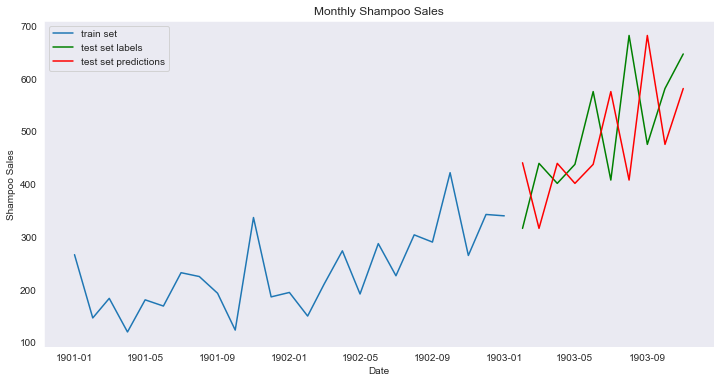

In [259]:
plt.figure(figsize=(12,6));
plt.plot(shampoo_sales_train.Date, shampoo_sales_train.Sales);
plt.plot(shampoo_sales_test.Date, shampoo_sales_test['t+1'], color='green');
plt.plot(shampoo_sales_test.Date, shampoo_sales_test.naive_pred, color='red');
plt.xlabel('Date');
plt.ylabel('Shampoo Sales');
plt.title('Monthly Shampoo Sales');
plt.legend(['train set', 'test set labels', 'test set predictions']);

<a id='res'></a>
# Residual Forecast Errors

`e = y - yhat`
We often stop there and summarize the skill of a model as a summary of this error. Instead,
we can collect these individual residual errors across all forecasts and use them to better
understand the forecast model. Generally, when exploring residual errors we are looking for
patterns or structure. A sign of a pattern suggests that the errors are not random.


We expect the residual errors to be random, because it means that the model has captured
all of the structure and the only error left is the random fluctuations in the time series that
cannot be modeled. A sign of a pattern or structure suggests that there is more information
that a model could capture and use to make better predictions.

In [261]:
# let's explore the residuals on daily female births with naive forecasting
from sklearn.metrics import mean_squared_error

daily_fem_births['t+1'] = daily_fem_births.Births.shift(-1)

# Naive predictor
daily_fem_births['naive_pred'] = daily_fem_births.Births

# train test split with respect to order
train_size = int(daily_fem_births.shape[0] * 0.7)
daily_fem_births_train, daily_fem_births_test = daily_fem_births.iloc[:train_size,:] , daily_fem_births.iloc[train_size:, :]

daily_fem_births_test = daily_fem_births_test.dropna()

print("RMSE %.2f" % mean_squared_error(daily_fem_births_test['t+1'].values, 
                                      daily_fem_births_test['naive_pred'].values, squared=False))

daily_fem_births_test.tail(5)

RMSE 8.29


,Date,Births,t+1,naive_pred
359,1959-12-26,34,37.0,34
360,1959-12-27,37,52.0,37
361,1959-12-28,52,48.0,52
362,1959-12-29,48,55.0,48
363,1959-12-30,55,50.0,55


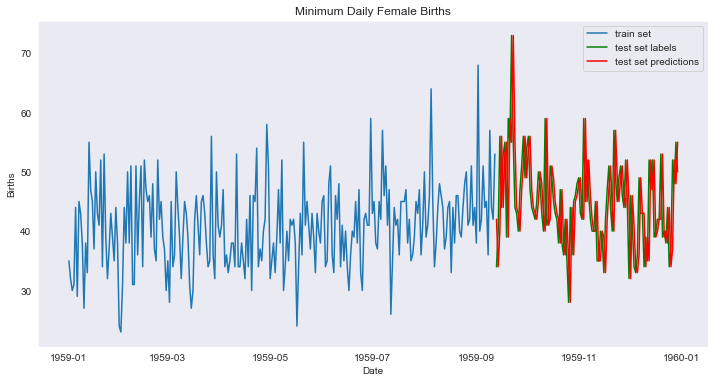

In [262]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births_train.Date, daily_fem_births_train.Births);
plt.plot(daily_fem_births_test.Date, daily_fem_births_test['t+1'], color='green');
plt.plot(daily_fem_births_test.Date, daily_fem_births_test.naive_pred, color='red');
plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');
plt.legend(['train set', 'test set labels', 'test set predictions']);

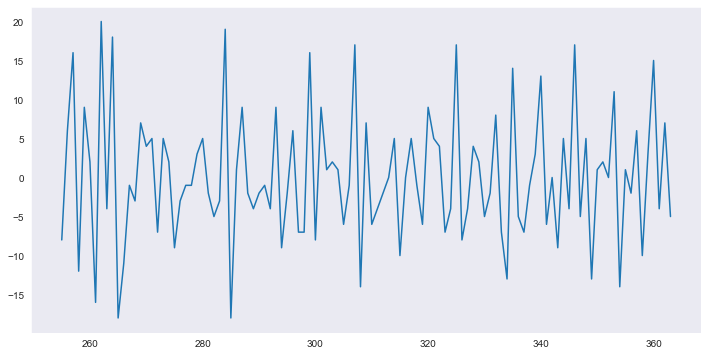

In [279]:
# calculate residuals
residuals = daily_fem_births_test['t+1'] - daily_fem_births_test.naive_pred
plt.figure(figsize=(12,6));
plt.plot(residuals);

Running the example shows a seemingly random plot of the residual time series. If we did
see trend, seasonal or cyclic structure, we could go back to our model and attempt to capture
those elements directly.


#### Residual Summary Statistics

We can calculate summary statistics on the residual errors. Primarily, we are interested in
the mean value of the residual errors. A value close to zero suggests no bias in the forecasts,
whereas positive and negative values suggest a positive or negative bias in the forecasts made.
It is useful to know about a bias in the forecasts as it can be directly corrected in forecasts prior
to their use or evaluation.

In [267]:
# Residual Summary Statistics
pd.DataFrame(residuals).describe()

,0
count,109.000000
mean,0.073394
std,8.325225
min,-18.000000
25%,-5.000000
50%,-1.000000
75%,5.000000
max,20.000000


Running the example shows a mean error value close to zero, but perhaps not close enough.
It suggests that there may be some bias and that we may be able to further improve the model
by performing a bias correction. This could be done by adding the mean residual error `(0.073394)`
to forecasts. This may work in this case, but it is a naive form of bias correction and there are
more sophisticated methods available.

#### Residual Histogram and Density Plots

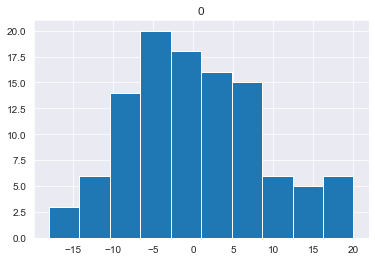

In [269]:
# Residual Histogram and Density Plots
pd.DataFrame(residuals).hist();

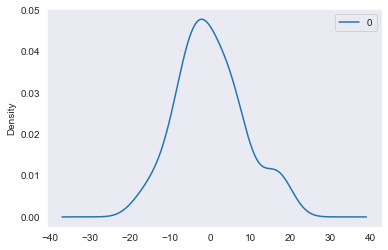

In [270]:
# Residual Density Plots
pd.DataFrame(residuals).plot(kind='kde');

We can see that the distribution does have a Gaussian look, but is perhaps more pointy,
showing an exponential distribution with some asymmetry. If the plot showed a distribution
that was distinctly non-Gaussian, it would suggest that assumptions made by the modeling
process were perhaps incorrect and that a different modeling method may be required. 

A large
skew may suggest the opportunity for performing a transform to the data prior to modeling,
such as taking the log or square root.

#### Residual Q-Q Plot

Residual Q-Q Plot to quickly check the normality of the distribution of residual errors.
The comparison is shown as a scatter plot (theoretical on the x-axis and observed on the y-axis) where a match between
the two distributions is shown as a diagonal line from the bottom left to the top-right of the plot

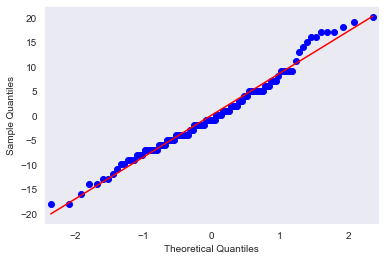

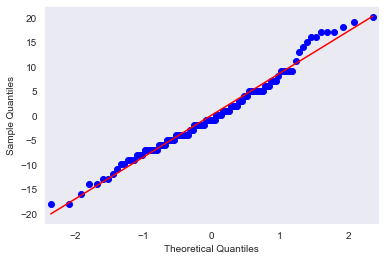

In [275]:
# Residual Q-Q Plot 
from statsmodels.graphics.gofplots import qqplot
residuals = daily_fem_births_test['t+1'] - daily_fem_births_test.naive_pred
qqplot(residuals, line='r')

[statsmodel qqplot](https://www.statsmodels.org/devel/generated/statsmodels.graphics.gofplots.qqplot.html)

Running the example shows a Q-Q plot that the distribution is seemingly normal with a few
bumps and outliers.

#### Residual Autocorrelation Plot

Autocorrelation calculates the strength of the relationship between an observation and observations at prior time steps. We can calculate the autocorrelation of the residual error time series
and plot the results. This is called an autocorrelation plot. We would not expect there to be
any correlation between the residuals.

This would be shown by autocorrelation scores being
below the threshold of significance (dashed and dotted horizontal lines on the plot).


A significant autocorrelation in the residual plot suggests that the model could be doing
a better job of incorporating the relationship between observations and lagged observations,
called autoregression. `Pandas` provides a `built-in function` for calculating an autocorrelation
plot, called `autocorrelation plot()`.

Below is an example of visualizing the autocorrelation for the residual errors. The x-axis
shows the lag and the y-axis shows the correlation between an observation and the lag variable,
where correlation values are between -1 and 1 for negative and positive correlations respectively

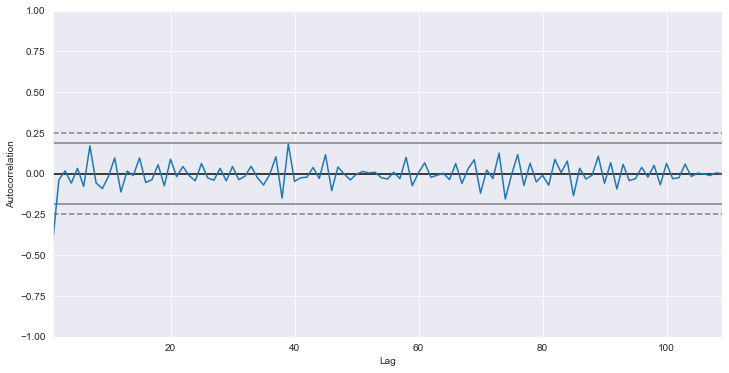

In [280]:
from pandas.plotting import autocorrelation_plot
residuals = daily_fem_births_test['t+1'] - daily_fem_births_test.naive_pred
plt.figure(figsize=(12,6));
autocorrelation_plot(residuals);

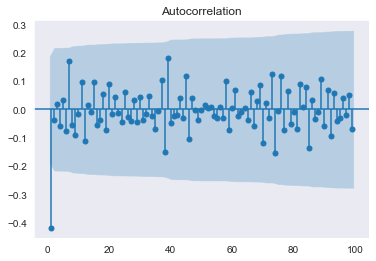

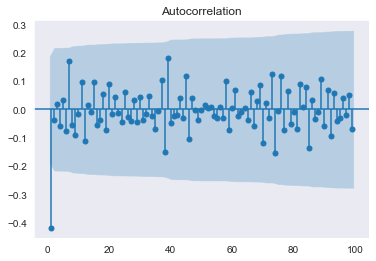

In [289]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(residuals, lags=range(1,100), alpha=0.05)

Running the example creates an autoregression plot of other residual errors. We do not see
an obvious autocorrelation trend across the plot. There may be some positive autocorrelation
worthy of further investigation at lag 7 that seems significant.

Visualizing residulas sometimes are not enough, we need statistical tests that helps to guide us.

#### Statistical Tests for Residuals


- [Normality (Jarque-Bera)](http://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.sarimax.SARIMAXResults.test_normality.html#statsmodels.tsa.statespace.sarimax.SARIMAXResults.test_normality)
    - Null hypothesis is normally distributed residuals (good, plays well with RMSE and similar error metrics)

- [Serial correlation (Ljung-Box)](http://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.sarimax.SARIMAXResults.test_serial_correlation.html#statsmodels.tsa.statespace.sarimax.SARIMAXResults.test_serial_correlation)
    - Null hypothesis is no serial correlation in residuals (independent of each other)

- [Heteroskedasticity](http://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.sarimax.SARIMAXResults.test_heteroskedasticity.html#statsmodels.tsa.statespace.sarimax.SARIMAXResults.test_heteroskedasticity)
    - Tests for change in variance between residuals.
    - The null hypothesis is no heteroskedasticity. That means different things depending on which alternative is selected:
        - Increasing: Null hypothesis is that the variance is not increasing throughout the sample; that the sum-of-squares in the later subsample is not greater than the sum-of-squares in the earlier subsample.
        - Decreasing: Null hypothesis is that the variance is not decreasing throughout the sample; that the sum-of-squares in the earlier subsample is not greater than the sum-of-squares in the later subsample.
        - Two-sided (default): Null hypothesis is that the variance is not changing throughout the sample. Both that the sum-of-squares in the earlier subsample is not greater than the sum-of-squares in the later subsample and that the sum-of-squares in the later subsample is not greater than the sum-of-squares in the earlier subsample.

- [Durbin Watson](https://en.wikipedia.org/wiki/Durbin–Watson_statistic)
    - Tests autocorrelation of residuals: we want between 1-3, 2 is ideal (no serial correlation)

[Durbin Watson statsmodel doc](https://www.statsmodels.org/dev/generated/statsmodels.stats.stattools.durbin_watson.html)

In [292]:
from statsmodels.stats.stattools import durbin_watson
# The null hypothesis of the test is that there is no serial correlation in the residuals.
residuals = daily_fem_births_test['t+1'] - daily_fem_births_test.naive_pred
durbin_watson(residuals)

2.825140261822068

[Heteroscedasticity Tests from statsmodels Python docs](https://www.statsmodels.org/dev/diagnostic.html)

So if the p-value of the Breusch-Pagan test is ≤ 0.05, we can assume with a 95% confidence that the distribution is heteroscedastic (not homoscedastic).

In [311]:
from statsmodels.stats.diagnostic import het_breuschpagan, het_goldfeldquandt
residuals = daily_fem_births_test['t+1'] - daily_fem_births_test.naive_pred
res = pd.DataFrame([])
res['residuals'] = residuals.values
res['residuals2'] = residuals.values
het = het_breuschpagan(res.residuals, res)

print('Statistic: %f' % het[0])
print('p-value: %f' % het[1])
print('f-statistic: %f' % het[2])
print('f_pvalue: %f' % het[3])

Statistic: 4.656634
p-value: 0.030934
f-statistic: 4.819822
f_pvalue: 0.030274


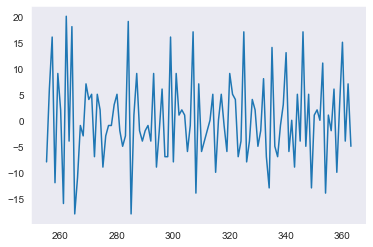

In [307]:
plt.plot(residuals);

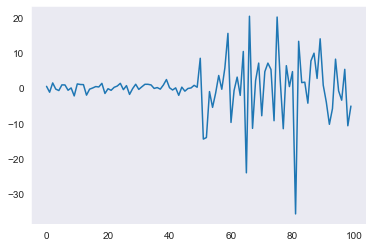

In [293]:
# generation of heteroscedasticity

# reproducibility
np.random.seed(1234)

# data
level_1 = np.random.normal(loc=0, scale=1.0, size = 50)
level_2 = np.random.normal(loc=0, scale=10.0, size = 50)
heteroscedasticity = np.append(level_1, level_2)
plt.plot(heteroscedasticity);

In [305]:
from statsmodels.stats.diagnostic import het_breuschpagan, het_goldfeldquandt
res = pd.DataFrame([])
res['residuals'] = heteroscedasticity
res['residuals2'] = heteroscedasticity
het = het_breuschpagan(res.residuals, res)

print('Statistic: %f' % het[0])
print('p-value: %f' % het[1])
print('f-statistic: %f' % het[2])
print('f_pvalue: %f' % het[3])

Statistic: 13.060694
p-value: 0.000302
f-statistic: 14.872544
f_pvalue: 0.000205


<a id='arima'></a>
# ARIMA Models

[nice code example](https://www.justintodata.com/arima-models-in-python-time-series-prediction/)

#### MA Models != Moving Average Smoothing
An important distinction is that a moving average model is not the same thing as moving average smoothing. What we did above was smoothing. It has important properties already discussed. However, we turn our attention to moving average models, which are a completely different beast.

Moving average smoothing is useful for estimating trend and seasonality of past data. MA models, on the other hand, are a useful forecasting model that regresses on past forecast errors in order to forecast future values. It is easy to lump the two techniques together, but they serve very different functions. 

#### MA Model Specifics
A MA model is defined by this equation: $y_t=c+e_t+θ_1e_{t−1}+θ_2e_{t−2}+⋯+θ_qe_{t−q}$ where $e_t$ is white noise. The value $c$ is a constant value and the $\theta$'s are coefficients, not unlike those found in linear regression.

Fitting a MA models is quite involved and requires iterative procedures. The details are beyond the scope of this lesson. However, statsmodels has this functionality built in so we can build a model with minimal effort. Let's take a look.

#### What is an Autoregressive Model?
AR models are similar to MA models with one key distinction. MA models regress on past forecast errors in order to forecast future values. On the other hand, AR models regress on actual past values, not past errors. 

This is the first order or **AR(1)** formula you should know: $y_t = \beta_0 + \beta_1y_{t-1}+\epsilon_t$

The $\beta$'s are just like those in linear regression and $\epsilon$ is irreducible error.

A second order or **AR(2)** would look like this: $y_t = \beta_0 + \beta_1y_{t-1}+\beta_2y_{t-2}+\epsilon_t$

The pattern of adding another coefficient and another past term continues to whichever order you choose. Choosing that order called *p* is something we will discuss shortly.

In the meantime, let's walk through a basic autocorrelation example. We'll generate our own data so we know the generative process.

#### Box-Jenkins Method
The Box-Jenkins method was proposed by George Box and Gwilym Jenkins in their seminal
**1970 textbook Time Series Analysis: Forecasting and Control**
. The approach starts with the
assumption that the process that generated the time series can be approximated using an ARMA
model if it is stationary or an ARIMA model if it is non-stationary. The 2016 5th edition of the
textbook (Part Two, page 177) refers to the process as a stochastic model building and that it
is an iterative approach that consists of the following 3 steps:

1. **Identification.** Use the data and all related information to help select a sub-class of model that may best summarize the data.

2. **Estimation.** Use the data to train the parameters of the model (i.e. the coefficients).

3. **Diagnostic Checking**. Evaluate the fitted model in the context of the available data and check for areas where the model may be improved. It is an iterative process, so that as new information is gained during diagnostics, you cancircle back to step 1 and incorporate that into new model classes. Let’s take a look at these steps in more detail.

#### Identification
The identification step is further broken down into: Assess whether the time series is stationary,
and if not, how many differences are required to make it stationary. Identify the parameters of
an ARMA model for the data. The identification step is further broken down into: Assess whether the time series is stationary,
and if not, how many differences are required to make it stationary. Identify the parameters of
an ARMA model for the data.

Below are some tips during identification.
- **Unit Root Tests.** Use unit root statistical tests on the time series to determine whether
or not it is stationary. Repeat after each round of differencing.
- **Avoid over differencing.** Differencing the time series more than is required can result
in the addition of extra serial correlation and additional complexity.

#### Configuring AR and MA
Two diagnostic plots can be used to help choose the p and q parameters of the ARMA or
ARIMA. They are:
- **Autocorrelation Function (ACF).** The plot summarizes the correlation of an observation with lag values. The x-axis shows the lag and the y-axis shows the correlation
coefficient between -1 and 1 for negative and positive correlation.
- **Partial Autocorrelation Function (PACF).** The plot summarizes the correlations for
an observation with lag values that is not accounted for by prior lagged observations.
Both plots are drawn as bar charts showing the 95% and 99% confidence intervals as
horizontal lines. Bars that cross these confidence intervals are therefore more significant and
worth noting. Some useful patterns you may observe on these plots are:
- The model is AR if the ACF trails off after a lag and has a hard cut-off in the PACF after
a lag. This lag is taken as the value for p.
- The model is MA if the PACF trails off after a lag and has a hard cut-off in the ACF after
the lag. This lag value is taken as the value for q.
- The model is a mix of AR and MA if both the ACF and PACF trail off.

#### Diagnostic Checking

The idea of diagnostic checking is to look for evidence that the model is not a good fit for the
data. Two useful areas to investigate diagnostics are:
1. Overfitting.
2. Residual Errors. (The check that was explained before for the residuals)


[statsmodels ARIMA Doc](https://www.statsmodels.org/dev/generated/statsmodels.tsa.arima.model.ARIMA.html)

This model is the basic interface for ARIMA-type models, including those with exogenous regressors and those with seasonal components. The most general form of the model is SARIMAX(p, d, q)x(P, D, Q, s). It also allows all specialized cases, including

- autoregressive models: AR(p)

- moving average models: MA(q)

- mixed autoregressive moving average models: ARMA(p, q)

- integration models: ARIMA(p, d, q)

- seasonal models: SARIMA(P, D, Q, s)


- p: The number of lag observations included in the model, also called the lag order.
- d: The number of times that the raw observations are differenced, also called the degree
of differencing.
- q: the order of moving average.

#### let's start with AR model

In [406]:
from statsmodels.tsa.arima.model import ARIMA

In [358]:
# apply to a stationary data - daily female birth - AR Model

# train test split with respect to order
train_size = int(daily_fem_births.shape[0] * 0.7)
daily_fem_births_train, daily_fem_births_test = daily_fem_births.iloc[:train_size,:] , daily_fem_births.iloc[train_size:, :]

model = ARIMA(endog=daily_fem_births_train.Births, order=(1,0,0))
model_fit = model.fit()

# get residuals values for later study
residuals = model_fit.resid

# summary of fit model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                 Births   No. Observations:                  255
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -859.774
Date:                Tue, 25 Oct 2022   AIC                           1725.548
Time:                        14:26:07   BIC                           1736.172
Sample:                             0   HQIC                          1729.822
                                - 255                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         40.8055      0.518     78.825      0.000      39.791      41.820
ar.L1          0.0915      0.068      1.341      0.180      -0.042       0.225
sigma2        49.6690      3.988     12.456      0.0

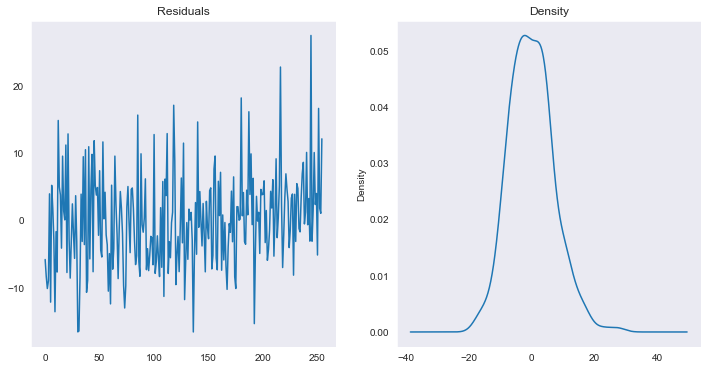

In [420]:
residuals = model_fit.resid
fig, ax = plt.subplots(1,2);
residuals.plot(title='Residuals', ax=ax[0], figsize=(12,6));
residuals.plot(title='Density', kind='kde', ax=ax[1]);

In [382]:
#predict method predict in sample and out of sample, it means it start its prediction from the index you specify.

train_predictions = model_fit.predict(start=0, end=daily_fem_births_train.shape[0]-1) # predict train data (insample only)

# or 

#predictions = model_fit.predict() # predict train data (insample only)

print("Training RMSE %.2f" % mean_squared_error(daily_fem_births_train.Births, 
                                train_predictions, squared=False))

Training RMSE 7.05


In [ ]:
Note if you have a dataframe or series with date index you can do the below.
start_date = '2020-06-12'
end_date   = '2021-06-04'
df['forecast'] = results.predict(start=start_date, end=end_date)

In [383]:
#predict only predicts the out of sample which is at the last index of train data to last index of test data
test_predictions = model_fit.predict(start=daily_fem_births_train.shape[0], 
                                end=(daily_fem_births_train.shape[0]+daily_fem_births_test.shape[0])-1) 

print("RMSE %.2f" % mean_squared_error(daily_fem_births_test.Births, 
                                test_predictions, squared=False))

RMSE 8.19


In [404]:
 model_fit.predict(typ='levels')

0      40.805748
1      40.325569
2      40.112418
3      39.963574
4      40.059251
         ...    
250    41.138715
251    40.377790
252    42.190067
253    40.956482
254    40.892654
Name: predicted_mean, Length: 255, dtype: float64

In [384]:
#forecast only predicts the out of sample and you specify the number of steps you want
test_predictions = model_fit.forecast(steps=daily_fem_births_test.shape[0])

print("RMSE %.2f" % mean_squared_error(daily_fem_births_test.Births, 
                                test_predictions, squared=False))

RMSE 8.19


In [455]:
predictions[:10]

0    40.805748
1    40.325569
2    40.112418
3    39.963574
4    40.059251
5    41.133939
6    39.795219
7    41.239209
8    40.952389
9    40.559870
Name: predicted_mean, dtype: float64

In [378]:
predictions

255    41.920839
256    40.907475
257    40.814787
258    40.806309
259    40.805534
         ...    
360    40.805456
361    40.805456
362    40.805456
363    40.805456
364    40.805456
Name: predicted_mean, Length: 110, dtype: float64

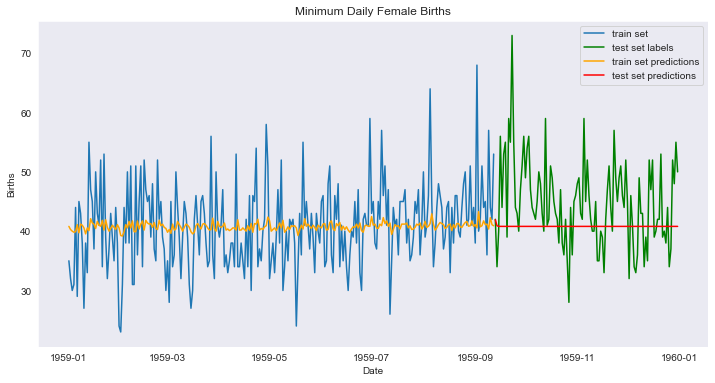

In [386]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births_train.Date, daily_fem_births_train.Births);
plt.plot(daily_fem_births_test.Date, daily_fem_births_test.Births, color='green');
plt.plot(daily_fem_births_train.Date, train_predictions, color='orange');
plt.plot(daily_fem_births_test.Date, test_predictions, color='red');

plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');
plt.legend(['train set', 'test set labels', 'train set predictions', 'test set predictions']);

**Note**: a `AR(p)` for model for example you can
predict `p` periods in the future and
no more after that it just gonna predict `constant parameter` in the model equation, that's why there is a constant horizontal line.

PACF is a useful tool for identifying the order of the AR model.

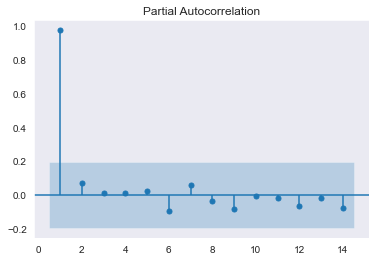

In [387]:
from statsmodels.graphics.tsaplots import plot_pacf

fig = plot_pacf(data, lags=range(1,15), alpha=0.05)

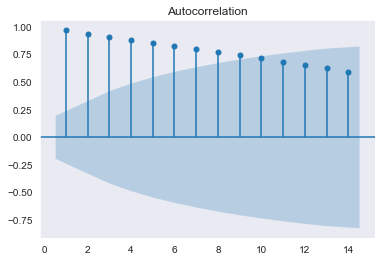

In [388]:
from statsmodels.graphics.tsaplots import plot_acf

fig = plot_acf(data, lags=range(1,15), alpha=0.05)

This example shows that an AR(1) model is most appropriate for this data. We know this because the partial autocorrelation is significant for this lag but for no other lags.

An explanation is in order. First, the blue region represents a confidence interval. Alpha in this case was set to 0.05 (95% confidence interval). This can be set to whatever float value you require. See the **plot_acf** function for details. 

The stems represent lagged correlation values. In other words, a lag of 1 correlates almost perfectly with the current endogenous value. A lag of 2 correlates nearly but not quite as well. And so on. Remember that we're regressing on past forecast errors; that's the correlation we're inspecting here. 

Correlations outside of the confidence interval are statistically significant whereas the others are not. You can use this plot to choose the value of *q* to include in your MA model. One key thing to note is that **MA models require stationarity**. You should see correlations drop quickly. If they don't, that's a sign that your data is not stationary, as we see here.

In the interest of rigor, we'll test our data with the Augmented Dickey-Fuller test, though we know how this particular data was generated (i.e. it has trend and seasonality). Therefore, it is not stationary. We can, however, transform it by applying a difference and checking for stationarity once again.

<font color='red'>The performance is not good, is the data stationary? adf said it was stationary, but is it stationary in variance?


In [392]:
# let's try again with log data

# apply to a stationary data - daily female birth - AR Model

# train test split with respect to order
train_size = int(daily_fem_births.shape[0] * 0.7)
daily_fem_births_train, daily_fem_births_test = daily_fem_births.iloc[:train_size,:] , daily_fem_births.iloc[train_size:, :]

model = ARIMA(endog=np.log(daily_fem_births_train.Births), order=(1,0,0))
model_fit = model.fit()

# get residuals values for later study
residuals = model_fit.resid

# summary of fit model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                 Births   No. Observations:                  255
Model:                 ARIMA(1, 0, 0)   Log Likelihood                  85.468
Date:                Tue, 25 Oct 2022   AIC                           -164.936
Time:                        14:50:11   BIC                           -154.312
Sample:                             0   HQIC                          -160.662
                                - 255                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.6938      0.013    288.753      0.000       3.669       3.719
ar.L1          0.1332      0.062      2.150      0.032       0.012       0.255
sigma2         0.0299      0.002     11.987      0.0

In [394]:
train_predictions = model_fit.predict() # predict train data (insample only)

print("Training RMSE %.2f" % mean_squared_error(daily_fem_births_train.Births, 
                                np.exp(train_predictions), squared=False))

#forecast only predicts the out of sample and you specify the number of steps you want
test_predictions = model_fit.forecast(steps=daily_fem_births_test.shape[0])

print("Test RMSE %.2f" % mean_squared_error(daily_fem_births_test.Births, 
                                np.exp(test_predictions), squared=False))

Training RMSE 7.06
Test RMSE 8.50


In [395]:
train_predictions = model_fit.predict() # predict train data (insample only)

print("Training RMSE %.2f" % mean_squared_error(np.log(daily_fem_births_train.Births), 
                                train_predictions, squared=False))

#forecast only predicts the out of sample and you specify the number of steps you want
test_predictions = model_fit.forecast(steps=daily_fem_births_test.shape[0])

print("Test RMSE %.2f" % mean_squared_error(np.log(daily_fem_births_test.Births), 
                                test_predictions, squared=False))

Training RMSE 0.17
Test RMSE 0.19


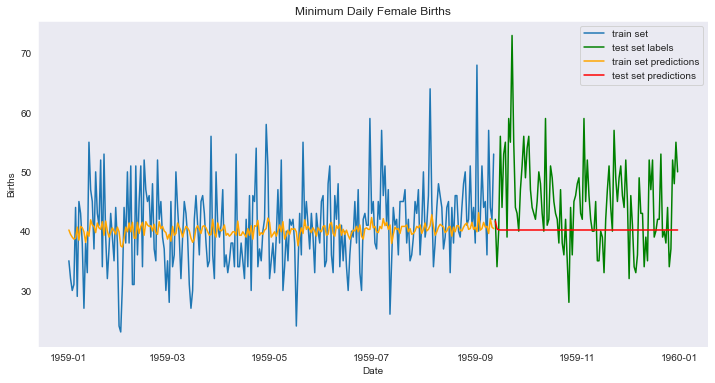

In [397]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births_train.Date, daily_fem_births_train.Births);
plt.plot(daily_fem_births_test.Date, daily_fem_births_test.Births, color='green');
plt.plot(daily_fem_births_train.Date, np.exp(train_predictions), color='orange');
plt.plot(daily_fem_births_test.Date, np.exp(test_predictions), color='red');

plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');
plt.legend(['train set', 'test set labels', 'train set predictions', 'test set predictions']);

#### ARIMA model without a constant

[statsmodels ARIMA Doc](https://www.statsmodels.org/dev/generated/statsmodels.tsa.arima.model.ARIMA.html)


In [451]:
p = np.poly1d([1,1,1,1])
print(p)

   3     2
1 x + 1 x + 1 x + 1


In [445]:
# ARIMA with trend='c' means with a const and 'n' means model with no const and ‘t’ indicates a linear trend in time  
# or 'ct' for both. Can also be specified as an iterable defining a polynomial, as in numpy.poly1d.`
model = ARIMA(endog=daily_fem_births_train.Births, order=(1,0,0), trend='n') 
model_fit = model.fit() 
# summary of fit model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                 Births   No. Observations:                  255
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -936.475
Date:                Tue, 25 Oct 2022   AIC                           1876.949
Time:                        18:55:05   BIC                           1884.032
Sample:                             0   HQIC                          1879.798
                                - 255                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9741      0.014     70.114      0.000       0.947       1.001
sigma2        89.6002      7.820     11.458      0.000      74.273     104.927
Ljung-Box (L1) (Q):                  58.87   Jarque-

#### Now let's try a MA model - PACF & ACF shows that MA model is not the best option here.

In [400]:
# apply to a stationary data - daily female birth - MA Model

# train test split with respect to order
train_size = int(daily_fem_births.shape[0] * 0.7)
daily_fem_births_train, daily_fem_births_test = daily_fem_births.iloc[:train_size,:] , daily_fem_births.iloc[train_size:, :]

model = ARIMA(endog=daily_fem_births_train.Births, order=(0,0,1))
model_fit = model.fit()

# get residuals values for later study
residuals = model_fit.resid

# summary of fit model
print(model_fit.summary())

train_predictions = model_fit.predict() # predict train data (insample only)

print("Training RMSE %.2f" % mean_squared_error(daily_fem_births_train.Births, 
                                train_predictions, squared=False))

#forecast only predicts the out of sample and you specify the number of steps you want
test_predictions = model_fit.forecast(steps=daily_fem_births_test.shape[0])

print("Test RMSE %.2f" % mean_squared_error(daily_fem_births_test.Births, 
                                test_predictions, squared=False))
      


                               SARIMAX Results                                
Dep. Variable:                 Births   No. Observations:                  255
Model:                 ARIMA(0, 0, 1)   Log Likelihood                -859.869
Date:                Tue, 25 Oct 2022   AIC                           1725.739
Time:                        15:05:55   BIC                           1736.363
Sample:                             0   HQIC                          1730.012
                                - 255                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         40.8057      0.510     79.987      0.000      39.806      41.806
ma.L1          0.0833      0.068      1.217      0.224      -0.051       0.217
sigma2        49.7083      3.984     12.476      0.0

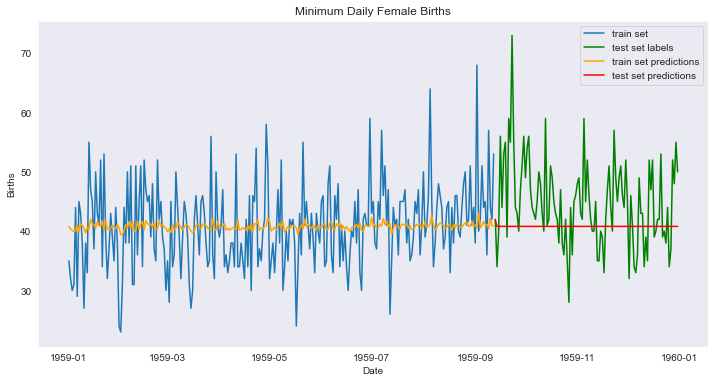

In [401]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births_train.Date, daily_fem_births_train.Births);
plt.plot(daily_fem_births_test.Date, daily_fem_births_test.Births, color='green');
plt.plot(daily_fem_births_train.Date, train_predictions, color='orange');
plt.plot(daily_fem_births_test.Date, test_predictions, color='red');

plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');
plt.legend(['train set', 'test set labels', 'train set predictions', 'test set predictions']);

**Note**: a `MA(q)` for model for example you can
predict `q` periods in the future and
no more after that it just gonna predict
the mean for any future periods which is the `constant parameter` in the model equation, that's why there is a constant horizontal line.

<font color='red'> Investigate why MA produce exactly the same result as AR ?!!
    
[Check statsmodels ARIMA FAQ to find an answer](https://www.statsmodels.org/dev/examples/notebooks/generated/statespace_sarimax_faq.html)

When a model contains a MA component, the prediction is more complicated since errors are never directly observable. The prediction is still `Y_t | Y_t-1, Y_t-2,...` and when the MA component is invertible, then the optimal prediction can be represented as a `t-lag AR process`. When t is large, this should be very close to the prediction as if the errors were observable. For short lags, this can differ markedly. This note is taken from this [Check statsmodels ARIMA FAQ to find an answer](https://www.statsmodels.org/dev/examples/notebooks/generated/statespace_sarimax_faq.html)

There's not a lot of
pure moving average processes out in the
wild if we look at some real data
usually the moving average component is
just one part with other parts like the
autoregressive maybe some seasonality
maybe some GARCH maybe some arch stuff
but usually we're not looking at pure
moving average. This note is taken from this [video](https://www.youtube.com/watch?v=uBYOJfwQeME&list=PLvcbYUQ5t0UHOLnBzl46_Q6QKtFgfMGc3&index=14&ab_channel=ritvikmath)

The best way to use MA on its own to try it is to generate errors that could be the difference between actual and predicted values from a naive predictor or from an AR model or any other model or random generation of errors. As MA is a model for residuals.

#### objective of the below is to fit a MA model on residuals data with the below distribution and a simulated MA(2) model series.

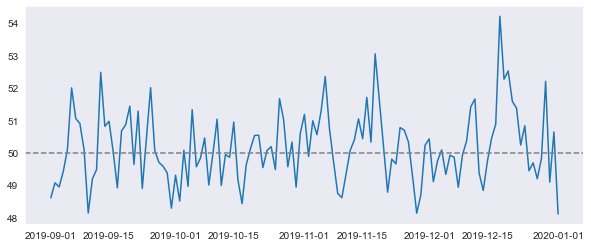

In [459]:

# generate error data from a standard normal dist.
errors = np.random.normal(0, 1, 400)
date_index = pd.date_range(start='9/1/2019', end='1/1/2020')
mu = 50
series = []
for t in range(1,len(date_index)+1):
    # time series data simulation where y_t = 50 + 0.4 eps_t-1 + 0.3 eps_t-1 + eps_t # This is true parameters of MA(2) model
    series.append(mu + 0.4*errors[t-1] + 0.3*errors[t-2] + errors[t])
series = pd.Series(series, date_index)
series = series.asfreq(pd.infer_freq(series.index))
plt.figure(figsize=(10,4))
plt.plot(series)
plt.axhline(mu, linestyle='--', color='grey')

In [462]:
from datetime import datetime, timedelta
# Get training and testing sets
train_end = datetime(2019,12,30)
test_end = datetime(2020,1,1)

train_data = series[:train_end]
test_data = series[train_end + timedelta(days=1):test_end]

#create the model
model = ARIMA(train_data, order=(0,0,2))
#fit the model
model_fit = model.fit()
#summary of the model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  121
Model:                 ARIMA(0, 0, 2)   Log Likelihood                -172.291
Date:                Wed, 26 Oct 2022   AIC                            352.583
Time:                        13:55:15   BIC                            363.766
Sample:                    09-01-2019   HQIC                           357.125
                         - 12-30-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         50.1592      0.158    316.914      0.000      49.849      50.469
ma.L1          0.3189      0.105      3.030      0.002       0.113       0.525
ma.L2          0.2952      0.109      2.712      0.0

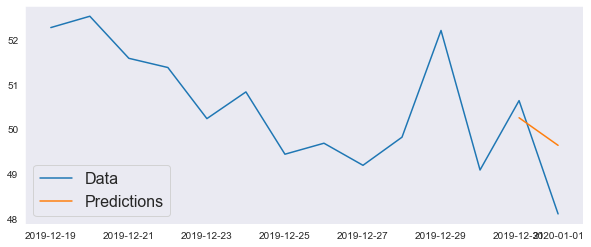

In [463]:
#get prediction start and end dates
pred_start_date = test_data.index[0]
pred_end_date = test_data.index[-1]

#get the predictions and residuals
predictions = model_fit.predict(start=pred_start_date, end=pred_end_date)
residuals = test_data - predictions

plt.figure(figsize=(10,4))

plt.plot(series[-14:])
plt.plot(predictions)

plt.legend(('Data', 'Predictions'), fontsize=16)

In [464]:
print('Root Mean Squared Error:', np.sqrt(np.mean(residuals**2)))


Root Mean Squared Error: 1.1170570030196272


**Notes**:
We also would
prefer the forecasted values to be in the original scale, in case we performed any differencing
(`d > 0` when configuring the model). This can be specified by setting the typ argument to the
value ’levels’: `typ=’levels’`.
Alternately, we can avoid all of these specifications by using the forecast() function which
performs a one-step forecast using the model. We can split the training dataset into train and
test sets, use the train set to fit the model, and generate a prediction for each element on the
test set.

#### Rolling Forecast ARIMA Model
A rolling forecast is required given the dependence on observations in prior time steps for
differencing and the AR model. A crude way to perform this rolling forecast is to re-create the
ARIMA model after each new observation is received. We manually keep track of all observations
in a list called history that is seeded with the training data and to which new observations are
appended each iteration.
 
**walk-forward validation**

`
predictions = []
for t in range(len(test)):
model = ARIMA(history, order=(1,0,0))
model_fit = model.fit()
output = model_fit.forecast()
yhat = output[0]
predictions.append(yhat)`

<font color='Brown'>Now let's repeat the example using roll forward forecast and check if the model improves, as we said it cannot predict steps further than the order of model.

In [ ]:
plt.figure(figsize=(12,6));
plt.plot(daily_fem_births_train.Date, daily_fem_births_train.Births);
plt.plot(daily_fem_births_test.Date, daily_fem_births_test.Births, color='green');
plt.plot(daily_fem_births_train.Date, train_predictions, color='orange');
plt.plot(daily_fem_births_test.Date, test_predictions, color='red');

plt.xlabel('Date');
plt.ylabel('Births');
plt.title('Minimum Daily Female Births');
plt.legend(['train set', 'test set labels', 'train set predictions', 'test set predictions']); 

#### Grid Search ARIMA Hyperparamters with RMSE, AIC, BIC,...,etc. P.237

In [457]:
# we can try different models and pick the lowest AIC and BIC
model_fit.aic

1876.9493279498574

In [458]:
model_fit.bic

1884.0318550401744

#### Forecast Confidence Intervals P.256

In [439]:
# forecast
result = model_fit.get_forecast()
# summarize forecast and confidence intervals
print('Expected: %.3f' % result.predicted_mean)
print('Forecast: %.3f' % daily_fem_births_test.Births[255])
print('Standard Error: %.3f' % result.se_mean)
ci = result.conf_int(0.05).values # dataframe for next forecast CI
print('95%% Interval: %.3f to %.3f' % (ci[0,0], ci[0,1]))

Expected: 41.814
Forecast: 42.000
Standard Error: 7.050
95% Interval: 27.996 to 55.633


#### Save Model

In [405]:
model_fit.save('ar_model.pkl')

#### Load Model

In [413]:
from statsmodels.tsa.arima.model import ARIMAResults

model = ARIMAResults.load('ar_model.pkl')
predictions = model.predict()

In [411]:
model.params

const     40.805748
ma.L1      0.083281
sigma2    49.708289
dtype: float64

#### S-ARIMA

[Video Tutorial ritvikmath YouTube Channel](https://www.youtube.com/watch?v=Al8m6K_stfA&list=PLvcbYUQ5t0UHOLnBzl46_Q6QKtFgfMGc3&index=23&ab_channel=ritvikmath)

[ritvikmath Github Tutorial](https://github.com/ritvikmath/Time-Series-Analysis/blob/master/SARIMA%20Model.ipynb)

In [ ]:
# SARIMA
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(endog=daily_fem_births_train.Births, order=(1,0,0), seasonal_order=(0, 0, 0, 0))

[S-ARIMAX statsmodels doc](https://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.sarimax.SARIMAX.html#statsmodels.tsa.statespace.sarimax.SARIMAX)

In [ ]:
import statsmodels.api as sm

# fit SARIMAX monthly based on helper plots
sar = sm.tsa.statespace.SARIMAX(monthly_temp.temp, 
                                order=(1,1,0), 
                                seasonal_order=(0,1,0,12), 
                                trend='c').fit()
sar.summary()

In [ ]:
# create and run statistical tests on model
norm_val, norm_p, skew, kurtosis = sar.test_normality('jarquebera')[0]
lb_val, lb_p = sar.test_serial_correlation(method='ljungbox')[0]
het_val, het_p = sar.test_heteroskedasticity('breakvar')[0]

# we want to look at largest lag for Ljung-Box, so take largest number in series
# there's intelligence in the method to determine how many lags back to calculate this stat
lb_val = lb_val[-1]
lb_p = lb_p[-1]

from statsmodels.stats.stattools import durbin_watson
durbin_watson = sm.stats.stattools.durbin_watson(sar.filter_results.standardized_forecasts_error[0, sar.loglikelihood_burn:])

print('Normality: val={:.3f}, p={:.3f}'.format(norm_val, norm_p));
print('Ljung-Box: val={:.3f}, p={:.3f}'.format(lb_val, lb_p));
print('Heteroskedasticity: val={:.3f}, p={:.3f}'.format(het_val, het_p));
print('Durbin-Watson: d={:.2f}'.format(durbin_watson))

<a id='corr'></a>
# Autocorrelation and Partial Autocorrelation

#### Autocorrelation
An autoregression model makes an assumption that the observations at current and previous
time steps are useful to predict the value at the next time step. This relationship between
variables is called correlation. If both variables change in the same direction (e.g. go up
together or down together), this is called a positive correlation. 

If the variables move in opposite
directions as values change (e.g. one goes up and one goes down), then this is called negative
correlation.


We can use statistical measures to calculate the correlation between the output variable and
values at previous time steps at various different lags. **The stronger the correlation between the
output variable and a specific lagged variable, the more weight that autoregression model can
put on that variable when modeling.**

Again, because the correlation is calculated between the
variable and itself at previous time steps, it is called an autocorrelation. It is also called serial
correlation because of the sequenced structure of time series data.
The correlation statistics can also help to choose which lag variables will be useful in a model
and which will not. Interestingly, if all lag variables show low or no correlation with the output
variable, then it suggests that the time series problem may not be predictable. This can be very
useful when getting started on a new dataset.

[statsmodel acf](https://www.statsmodels.org/devel/generated/statsmodels.graphics.tsaplots.plot_acf.html)

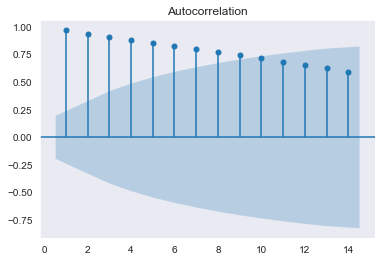

In [421]:
from statsmodels.graphics.tsaplots import plot_acf

fig = plot_acf(data, lags=range(1,15), alpha=0.05)

#### Partial Autocorrelation

A partial autocorrelation is a summary of the relationship between an observation in a time
series with observations at prior time steps with the relationships of intervening observations
removed.

The partial autocorrelation at lag k is the correlation that results after removing
the effect of any correlations due to the terms at shorter lags.
— Page 81, Section 4.5.6 Partial Autocorrelations, Introductory Time Series with R.


The autocorrelation for an observation and an observation at a prior time step is comprised
of both the direct correlation and indirect correlations. These indirect correlations are a linear
function of the correlation of the observation, with observations at intervening time steps. It is
these indirect correlations that the partial autocorrelation function seeks

[statsmodels pacf](https://www.statsmodels.org/devel/generated/statsmodels.graphics.tsaplots.plot_pacf.html)

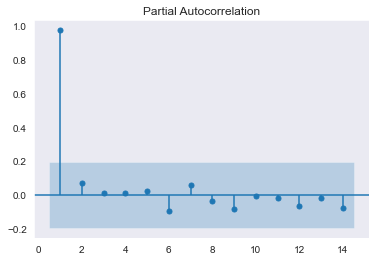

In [422]:
from statsmodels.graphics.tsaplots import plot_pacf

fig = plot_pacf(data, lags=range(1,15), alpha=0.05)

An explanation is in order. First, the blue region represents a confidence interval. Alpha in this case was set to 0.05 (95% confidence interval). This can be set to whatever float value you require. See the **plot_acf** function for details. 

The stems represent lagged correlation values. In other words, a lag of 1 correlates almost perfectly with the current endogenous value. A lag of 2 correlates nearly but not quite as well. And so on. Remember that we're regressing on past forecast errors; that's the correlation we're inspecting here. 

Correlations outside of the confidence interval are statistically significant whereas the others are not. You can use this plot to choose the value of *q* to include in your MA model. One key thing to note is that **MA models require stationarity**. You should see correlations drop quickly. If they don't, that's a sign that your data is not stationary, as we see here.

<a id='arch'></a>
# ARCH and GARCH Models

[Good video from ritvikmath YouTube Channel](https://www.youtube.com/watch?v=96nSIMS9_Y0&list=PLvcbYUQ5t0UHOLnBzl46_Q6QKtFgfMGc3&index=26&ab_channel=ritvikmath)

[Github Code from ritvikmath](https://github.com/ritvikmath/Time-Series-Analysis/blob/master/GARCH%20Model.ipynb)

[ARCH Library in Python and Installations](https://pypi.org/project/arch)

[ARCH Library Documentation](https://arch.readthedocs.io/en/latest/index.html)

In [8]:
!pip install arch

In [9]:
from arch import arch_model

<a id='fb'></a>
# Predicting with [Facebook](https://facebookincubator.github.io/prophet/) [Prophet](https://research.fb.com/prophet-forecasting-at-scale/)

conda install -c conda-forge fbprophet (to install)

In [91]:
#!conda install -c conda-forge fbprophet

^C


In [2]:
# fbprophet will require updated plotly for visualizations
!pip install --upgrade plotly

In [2]:
# to solve dead kernel issue for model.fit()
!pip install pystan==2.19.1.1

  Attempting uninstall: pystan
    Found existing installation: pystan 2.18.0.0
    Uninstalling pystan-2.18.0.0:
      Successfully uninstalled pystan-2.18.0.0


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fbprophet 0.7.1 requires cmdstanpy==0.9.5, which is not installed.
fbprophet 0.7.1 requires setuptools-git>=1.2, which is not installed.


In [7]:
!pip install cmdstanpy==0.9.5

  Using cached cmdstanpy-0.9.5-py3-none-any.whl (37 kB)
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.68
    Uninstalling cmdstanpy-0.9.68:
      Successfully uninstalled cmdstanpy-0.9.68


In [ ]:
# # https://github.com/facebook/prophet/issues/2052
# !pip uninstall fbprophet
# !pip install cmdstanpy==0.9.68
# !pip install pystan==2.19.1.1
# !pip install prophet

In [3]:
!pip install fbprophet

[example link](http://localhost:8888/notebooks/Desktop/Python%20Practices/Time%20Series/Intel%20-%20Time%20Series%20Course/Lesson_5_ARIMA/Notebooks/ARMA_ARIMA_SARIMA.ipynb)

The below example is taken from Facebook Prophet [Quick Start Documentation](https://facebook.github.io/prophet/docs/quick_start.html#python-api)

In [19]:
from fbprophet import Prophet

# read daily page views for the Wikipedia page for Peyton Manning; scraped into hosted CSV
data_path = 'https://raw.githubusercontent.com/PinkWink/DataScience/master/data/07.%20example_wp_peyton_manning.csv'
peyton = pd.read_csv(data_path)

In [9]:
peyton.head()

,ds,y
0,2007-12-10,14629
1,2007-12-11,5012
2,2007-12-12,3582
3,2007-12-13,3205
4,2007-12-14,2680


In [17]:
peyton.tail()

,ds,y
2900,2016-01-16,2483
2901,2016-01-17,10656
2902,2016-01-18,30754
2903,2016-01-19,9190
2904,2016-01-20,7269


In [10]:
peyton.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2905 entries, 0 to 2904
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   ds      2905 non-null   object
 1   y       2905 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 45.5+ KB


In [20]:
peyton['ds']= pd.to_datetime(peyton['ds'])

In [12]:
peyton.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2905 entries, 0 to 2904
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      2905 non-null   datetime64[ns]
 1   y       2905 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 45.5 KB


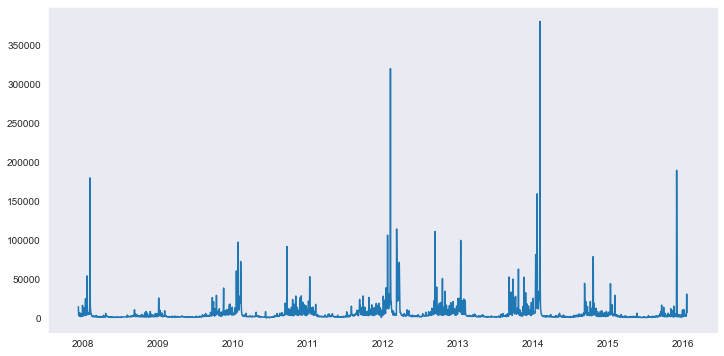

In [16]:
# plot data
plt.figure(figsize=(12,6))
plt.plot(peyton['ds'], peyton['y'])

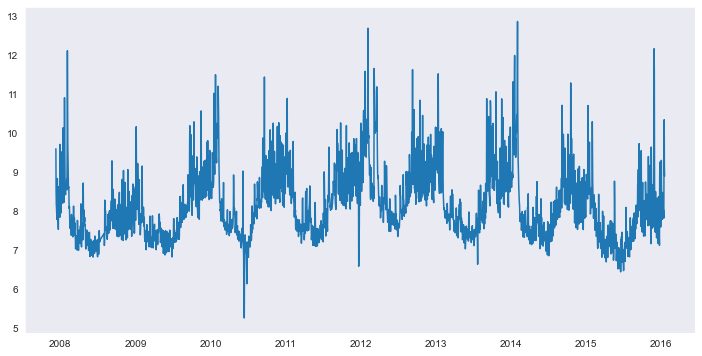

In [23]:
# plot log data
plt.figure(figsize=(12,6))
plt.plot(peyton['ds'], np.log(peyton['y']))

We fit the model by instantiating a new Prophet object. Any settings to the forecasting procedure are passed into the constructor. Then you call its fit method and pass in the historical dataframe. Fitting should take 1-5 seconds.

In [21]:
prophet_model = Prophet()
prophet_model.fit(peyton)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Predictions are then made on a dataframe with a column ds containing the dates for which a prediction is to be made. You can get a suitable dataframe that extends into the future a specified number of days using the helper method `Prophet.make_future_dataframe`. By default it will also include the dates from the history, so we will see the model fit as well.

In [10]:
future = prophet_model.make_future_dataframe(periods=365)
future.tail()

,ds
3265,2017-01-15
3266,2017-01-16
3267,2017-01-17
3268,2017-01-18
3269,2017-01-19


The `predict method` will assign each row in future a predicted value which it names yhat. If you pass in historical dates, it will provide an in-sample fit. The forecast object here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.

In [11]:
forecast = prophet_model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3265,2017-01-15,9017.605323,-5604.824714,26584.142866
3266,2017-01-16,14929.750919,-1187.592337,31871.236456
3267,2017-01-17,9848.323761,-5208.850084,26622.956647
3268,2017-01-18,8858.138003,-8473.667410,25393.231758
3269,2017-01-19,9339.182441,-6187.654187,25070.833702


In [13]:
forecast.head(3)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2007-12-10,3927.500020,-4948.138698,26922.768368,3927.500020,3927.500020,7407.533113,7407.533113,7407.533113,5993.879478,5993.879478,5993.879478,1413.653635,1413.653635,1413.653635,0.0,0.0,0.0,11335.033133
1,2007-12-11,3924.400794,-10573.050304,21921.917037,3924.400794,3924.400794,1454.173876,1454.173876,1454.173876,238.224111,238.224111,238.224111,1215.949764,1215.949764,1215.949764,0.0,0.0,0.0,5378.574670
2,2007-12-12,3921.301569,-13481.869098,19246.750214,3921.301569,3921.301569,-399.732604,-399.732604,-399.732604,-1432.728451,-1432.728451,-1432.728451,1032.995846,1032.995846,1032.995846,0.0,0.0,0.0,3521.568964


You can plot the forecast by calling the `Prophet.plot method` and passing in your forecast dataframe.



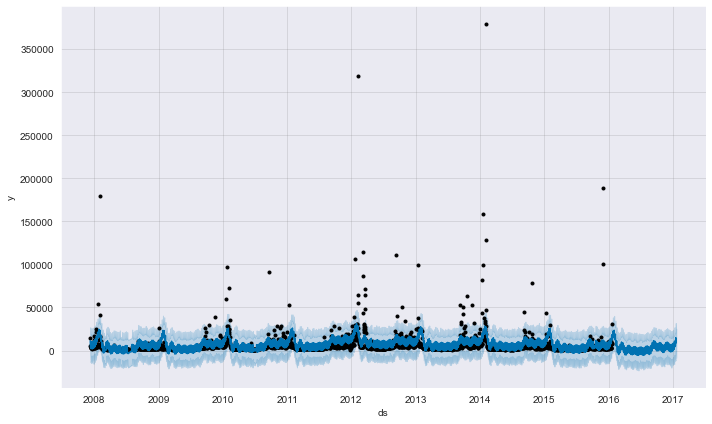

In [14]:
fig1 = prophet_model.plot(forecast)


If you want to see the forecast components, you can use the Prophet.plot_components method. By default you’ll see the trend, yearly seasonality, and weekly seasonality of the time series. If you include holidays, you’ll see those here, too.

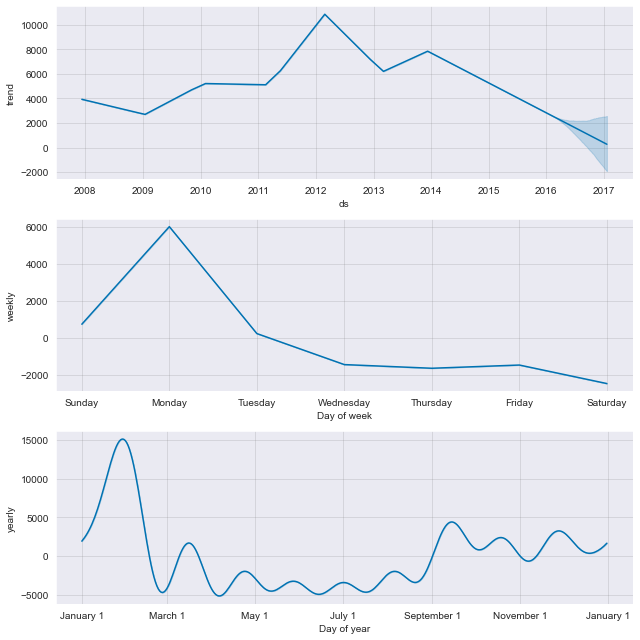

In [18]:
fig2 = prophet_model.plot_components(forecast)

An interactive figure of the forecast and components can be created with `plotly`. You will need to install plotly 4.0 or above separately, as it will not by default be installed with prophet. You will also need to install the `notebook` and `ipywidgets packages`.

In [16]:
from fbprophet.plot import plot_plotly, plot_components_plotly

plot_plotly(prophet_model, forecast)

In [17]:
plot_components_plotly(prophet_model, forecast)


#### fitting for log data

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


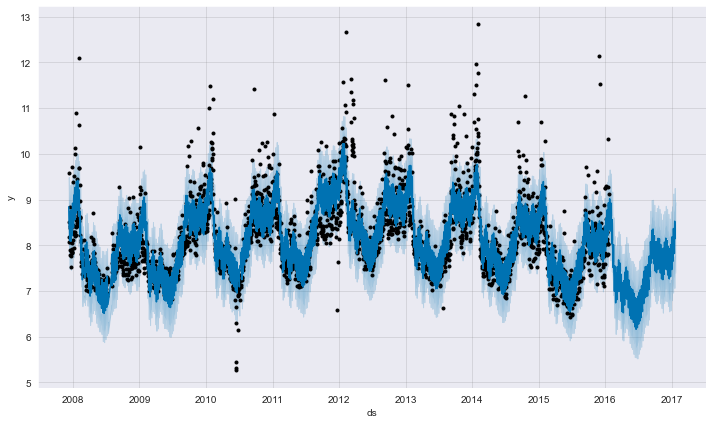

In [24]:
peyton['y']=np.log(peyton['y'])
prophet_model = Prophet()
prophet_model.fit(peyton)
forecast = prophet_model.predict(future)
fig1 = prophet_model.plot(forecast)


In [25]:
def mse(observations, estimates):
    
    sq_diff = (observations - estimates) ** 2
    mse = np.sum(sq_diff)
    
    return mse

In [29]:
mse(peyton['y'], forecast['yhat'])

679.5451033237796

In [28]:
np.sqrt(mse(peyton['y'], forecast['yhat']))

26.068085915996587

<a id='ml'></a>
# Time Series as Supervised Learning